In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import het_arch

# # Apply a generally pleasant style
# plt.style.use('seaborn-v0_8-whitegrid')
# sns.set_palette("viridis")
# pd.set_option('display.max_rows', None)        # Show all rows
# pd.set_option('display.max_columns', None)     # Show all columns
# pd.set_option('display.width', None)           # Disable line wrapping
# pd.set_option('display.max_colwidth', None)    # Show full column content 

In [2]:
def load_and_sort_csv(path):
    df = pd.read_csv(path, parse_dates=['Date'], index_col='Date')  # parse 'date' as datetime
    df.index = pd.to_datetime(df.index)
    return df

path = '../data/final/dataset.csv'

df = load_and_sort_csv(path)

df = df.asfreq('D')

In [6]:
import plotly.express as px
fig = px.line(df['btc_close'], title='BTC Close Price', 
              labels={'value': 'Price (USD)', 'index': 'Date'})
fig.update_layout(showlegend=False)
fig.show()


In [7]:
# Get the first 5 rows
df_head_5 = df.head(5)

# --- Logic to truncate columns for LaTeX ---
# Define how many columns to show at the start and end
num_start_cols = 3
num_end_cols = 2 # Or 3, depending on how many you want after ellipsis

# Get the first few columns
display_cols = df_head_5.iloc[:, :num_start_cols]

num_cols = df_head_5.shape[1]

# If there are too many columns, add an "..." column
if num_cols > (num_start_cols + num_end_cols):
    ellipsis_df = pd.DataFrame({'...': ['...'] * len(df_head_5)}, index=df_head_5.index)
    display_cols = pd.concat([display_cols, ellipsis_df], axis=1)
    
    # Add the last few columns
    display_cols = pd.concat([display_cols, df_head_5.iloc[:, -num_end_cols:]], axis=1)
else:
    # If not too many columns, just show them all
    display_cols = df_head_5

# Convert the truncated DataFrame to LaTeX
latex_table_string = display_cols.to_latex(
    index=True,
    float_format="%.3f",
    caption="First 5 Rows of My Data (Truncated Columns)",
    label="tab:dataframe_head_truncated"
)

print(latex_table_string)

# Optional: Reset pandas display options if you changed them globally
# pd.reset_option('display.max_columns')

\begin{table}
\caption{First 5 Rows of My Data (Truncated Columns)}
\label{tab:dataframe_head_truncated}
\begin{tabular}{lrrrlrr}
\toprule
 & btc_sma_5 & btc_ema_5 & btc_sma_14 & ... & EURUSD & btc_close \\
Date &  &  &  &  &  &  \\
\midrule
2017-01-01 00:00:00 & 974.545 & 968.764 & 908.781 & ... & 1.058 & 998.325 \\
2017-01-02 00:00:00 & 983.711 & 986.426 & 925.141 & ... & 1.053 & 1021.750 \\
2017-01-03 00:00:00 & 997.779 & 1005.564 & 942.495 & ... & 1.046 & 1043.840 \\
2017-01-04 00:00:00 & 1036.478 & 1055.286 & 965.384 & ... & 1.042 & 1154.730 \\
2017-01-05 00:00:00 & 1046.405 & 1041.317 & 976.016 & ... & 1.050 & 1013.380 \\
\bottomrule
\end{tabular}
\end{table}



# 🎯 Target Variable
- `btc_close`

---

## 📈 1. Technical Indicators

**Moving Averages & Derived Features**
- `btc_sma_5`, `btc_ema_5`
- `btc_sma_14`, `btc_ema_14`
- `btc_sma_21`, `btc_ema_21`
- `btc_sma_50`, `btc_ema_50`
- `btc_sma_14_50_diff`, `btc_ema_14_50_diff`
- `btc_sma_14_50_ratio`

**Slopes (Rate of Change)**
- `btc_sma_14_slope`, `btc_ema_14_slope`
- `btc_sma_21_slope`, `btc_ema_21_slope`
- `btc_sma_50_slope`, `btc_ema_50_slope`

**Distance from Trend**
- `btc_close_ema_21_dist`, `btc_close_ema_21_dist_norm`

**Momentum & Oscillators**
- `btc_rsi_14`
- `btc_macd`, `btc_macd_signal`, `btc_macd_diff`

**Volatility & Bands**
- `btc_bb_high`, `btc_bb_low`, `btc_bb_mid`, `btc_bb_width`
- `btc_atr_14`
- `btc_volatility_index`

**Volume**
- `btc_trading_volume`

---

## ⛓️ 2. Blockchain Indicators

**Usage / Activity**
- `active_addresses_blockchain`
- `estimated_transaction_volume_usd_blockchain`

**Hashing & Security**
- `hash_rate_blockchain`
- `difficulty_blockchain`

**Miner Economics**
- `miner_revenue_blockchain`

---

## 🧠 3. Sentiment Indicators

**On-Chain Derived Sentiment (CBBI)**
- `PiCycle_cbbi`, `RUPL_cbbi`, `RHODL_cbbi`, `Puell_cbbi`
- `2YMA_cbbi`, `Trolololo_cbbi`, `MVRV_cbbi`, `ReserveRisk_cbbi`
- `Woobull_cbbi`, `Confidence_cbbi`

**General Market Sentiment**
- `Fear Greed`

**Social / News Sentiment**
- `positive_sentiment`, `negative_sentiment`
- `bullish_sentiment`, `bearish_sentiment`
- `risk_uncertainty_sentiment`, `problem_malicious_sentiment`
- `active_trading_sentiment`, `long_term_investment_sentiment`
- `market_narrative_sentiment`, `core_technology_sentiment`
- `development_ecosystem_sentiment`, `news_events_sentiment`
- `regulations_sentiment`, `community_social_sentiment`
- `price_sentiment`, `volume_sentiment`, `marketcap_sentiment`

---

## 🌍 4. Cross-Market Indicators

**Commodities**
- `Gold_Price`, `Gold_Share`, `Gold_Volatility`
- `Oil_Crude_Price`, `Oil_Brent_Price`, `Oil_Volatility`

**Equity Benchmarks**
- `DJI`, `GSPC`, `IXIC`, `NYFANG`

**Volatility Index**
- `CBOE_Volatility`

**Currencies & FX**
- `DXY`, `EURUSD`

**Regional / Thematic ETFs**
- `EM_ETF`


In [85]:
# Missing dates
print(f"Original shape: {df.shape}")
print(f"Start: {df.index.min()}, End: {df.index.max()}")
print(f"Total calendar days: {(df.index.max() - df.index.min()).days + 1}")
print(f"Actual rows: {len(df)}")
print(f"Missing days: {(df.index.max() - df.index.min()).days + 1 - len(df)}")

# Find missing dates
date_range = pd.date_range(start=df.index.min(), end=df.index.max(), freq='D')
missing_dates = date_range.difference(df.index)
print("\nMissing dates:")
print(missing_dates)


Original shape: (2922, 78)
Start: 2017-01-01 00:00:00, End: 2024-12-31 00:00:00
Total calendar days: 2922
Actual rows: 2922
Missing days: 0

Missing dates:
DatetimeIndex([], dtype='datetime64[ns]', freq='D')


In [3]:
# --- Define Feature Lists ---
target_variable = 'btc_close'
# CBBI (Crypto Bubble Index) Features
cbbi_features = [
    'PiCycle_cbbi',      # Pi Cycle Top Indicator
    'RUPL_cbbi',         # Realized to Unrealized Profit/Loss
    'RHODL_cbbi',        # Realized HODL Ratio
    'Puell_cbbi',        # Puell Multiple
    '2YMA_cbbi',         # 2-Year Moving Average
    'Trolololo_cbbi',    # Trolololo Indicator
    'MVRV_cbbi',         # Market Value to Realized Value
    'ReserveRisk_cbbi',  # Reserve Risk
    'Woobull_cbbi',      # Woobull Indicator
    'Confidence_cbbi'    # Confidence Index
]

# Blockchain Network Features
blockchain_features = [
    'active_addresses_blockchain',                    # Daily active addresses
    'hash_rate_blockchain',                          # Network hash rate
    'miner_revenue_blockchain',                      # Miner revenue
    'difficulty_blockchain',                         # Mining difficulty
    'estimated_transaction_volume_usd_blockchain'    # Transaction volume in USD
]

# Cross-Market Features
cross_market_features = [
    # Commodities
    'Gold_Price', 'Gold_Share', 'Gold_Volatility',
    'Oil_Crude_Price', 'Oil_Brent_Price', 'Oil_Volatility',
    
    # Stock Indices
    'DJI', 'GSPC', 'IXIC', 'NYFANG',
    
    # Market Indicators
    'CBOE_Volatility', 'EM_ETF',
    
    # Currency
    'DXY', 'EURUSD'
]

# Market Sentiment Features
sentiment_features = [
    # General Sentiment
    'Fear Greed',
    
    # Directional Sentiment
    'positive_sentiment', 'negative_sentiment',
    'bullish_sentiment', 'bearish_sentiment',
    
    # Risk & Trading Sentiment
    'risk_uncertainty_sentiment',
    'problem_malicious_sentiment',
    'active_trading_sentiment',
    'long_term_investment_sentiment',
    
    # Market Context Sentiment
    'market_narrative_sentiment',
    'core_technology_sentiment',
    'development_ecosystem_sentiment',
    'news_events_sentiment',
    'regulations_sentiment',
    'community_social_sentiment',
    
    # Market Metrics Sentiment
    'price_sentiment',
    'volume_sentiment',
    'marketcap_sentiment'
]

technical_indicator_features = [
    # Moving Averages
    'btc_sma_5', 'btc_ema_5',
    'btc_sma_14', 'btc_ema_14',
    'btc_sma_21', 'btc_ema_21',
    'btc_sma_50', 'btc_ema_50',
    
    # MA Differences and Ratios
    'btc_sma_14_50_diff', 'btc_ema_14_50_diff',
    'btc_sma_14_50_ratio',
    
    # MA Slopes
    'btc_sma_14_slope', 'btc_ema_14_slope',
    'btc_sma_21_slope', 'btc_ema_21_slope',
    'btc_sma_50_slope', 'btc_ema_50_slope',
    
    # Price Distance from MAs
    'btc_close_ema_21_dist', 'btc_close_ema_21_dist_norm',
    
    # Momentum Indicators
    'btc_rsi_14',
    'btc_macd', 'btc_macd_signal', 'btc_macd_diff',
    
    # Volatility Indicators
    'btc_bb_high', 'btc_bb_low', 'btc_bb_mid', 'btc_bb_width',
    'btc_atr_14', 'btc_volatility_index',
    
    # Volume
    'btc_trading_volume'
]

all_features = (
    blockchain_features +
    cbbi_features +
    sentiment_features +
    cross_market_features +
    [target_variable]
)


In [5]:
# --- Basic Overview ---
# print("DataFrame Info:")
# df.info()
# print("\nMissing Values (sum):")
# print(df.isnull().sum()[df.isnull().sum() > 0])
print("\nBasic Statistics:")
df.describe(include='all').T
# print(f"\nDate Range: {df.index.min()} to {df.index.max()}")
# print(f"Data Frequency (inferred): {pd.infer_freq(df.index)}")


Basic Statistics:


,count,mean,std,min,25%,50%,75%,max
Price_cbbi,1988.0,25770.488617,22520.257076,974.76000,7783.572500,18634.955600,40652.651750,106225.000000
PiCycle_cbbi,1988.0,0.528127,0.262529,0.00000,0.339925,0.539500,0.709750,0.999900
RUPL_cbbi,1988.0,0.678422,0.227237,0.00000,0.571575,0.728500,0.850875,1.000000
RHODL_cbbi,1988.0,0.434491,0.317572,0.00000,0.133550,0.398700,0.733850,1.000000
Puell_cbbi,1988.0,0.531119,0.239438,0.00000,0.356900,0.525250,0.704050,1.000000
...,...,...,...,...,...,...,...,...
community_social_sentiment,1988.0,62.353924,34.177644,4.80000,39.800000,53.600000,73.800000,298.000000
price_sentiment,1988.0,1795.432596,1110.194956,77.00000,1017.750000,1482.000000,2215.000000,9945.000000
volume_sentiment,1988.0,135.519115,133.735594,1.00000,46.000000,83.000000,188.000000,983.000000
marketcap_sentiment,1988.0,66.837022,57.433540,3.00000,34.000000,51.000000,76.000000,642.000000


## Target Analysis
- trends
- seasonality
- cycle
- preriods of high/low volatility
- structural breaks

In [4]:
y = df[target_variable]
btc_log_returns = np.log(y).diff().dropna()

In [14]:
# Descriptive statistics for target variable
print(f"\nDescriptive Statistics for {target_variable}:")
print(y.describe())

# Additional statistics
print("\nAdditional Statistics:")
print(f"Skewness: {y.skew():.4f}")
print(f"Kurtosis: {y.kurtosis():.4f}")
print(f"Number of unique values: {y.nunique()}")
print(f"Missing values: {y.isnull().sum()}")



Descriptive Statistics for btc_close:
count      2922.000000
mean      25077.746694
std       22234.268944
min         777.757019
25%        7398.572510
50%       17131.819335
75%       39767.247075
max      106140.601600
Name: btc_close, dtype: float64

Additional Statistics:
Skewness: 1.0470
Kurtosis: 0.4017
Number of unique values: 2920
Missing values: 0



--- Performing Annual Decomposition for btc_close ---
Info for Annual decomposition: Auto-selected 'multiplicative' model.


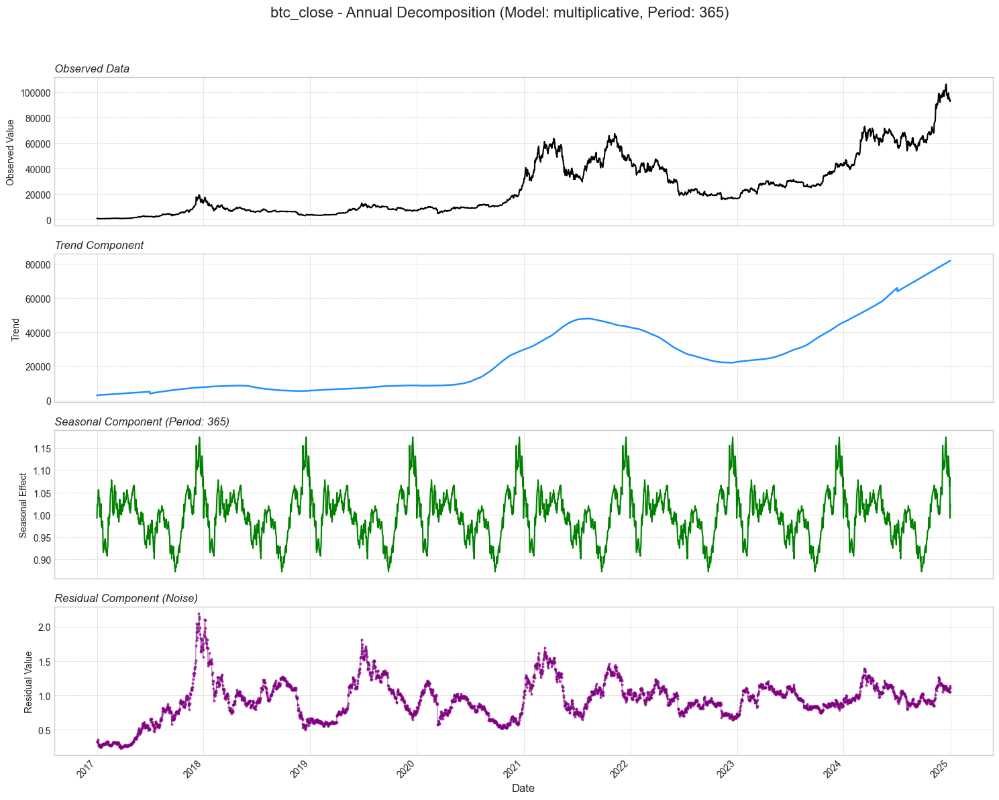

In [87]:
# --- Performing Decomposition for btc_close ---
def perform_seasonal_decomposition(data, target_col, period=7, model_choice='auto', period_name='Specified'):
    """
    Perform seasonal decomposition with automatic model selection and enhanced independent visualization.
    
    Args:
        data (pd.DataFrame): Input dataframe with a DatetimeIndex.
        target_col (str): Target column name for decomposition.
        period (int): Decomposition period (e.g., 7 for weekly, 30 for monthly).
        model_choice (str): Decomposition model ('auto', 'additive', or 'multiplicative').
        period_name (str): Descriptive name for the period (e.g., 'Weekly', 'Monthly') for titles.
    """
    
    # Ensure the target column exists and has no NaNs for decomposition
    if target_col not in data.columns:
        print(f"Error: Target column '{target_col}' not found in DataFrame.")
        return None
    
    series_to_decompose = data[target_col].dropna()
    if series_to_decompose.empty:
        print(f"Error: Series for '{target_col}' is empty after dropping NaNs.")
        return None
    if len(series_to_decompose) < 2 * period:
        print(f"Warning: Data length ({len(series_to_decompose)}) is less than twice the period ({2*period}). "
              f"Decomposition for '{period_name}' period={period} may be unreliable.")
        # You might choose to return None or proceed with caution
        if len(series_to_decompose) < period: # Definitely cannot proceed
            print(f"Error: Data length is less than the period itself. Cannot decompose for period {period}.")
            return None


    # Determine decomposition model
    actual_model = model_choice
    if actual_model == 'auto':
        if (series_to_decompose <= 0).any():
            actual_model = 'additive'
            print(f"Info for {period_name} decomposition: '{target_col}' contains zero or negative values. Auto-selected 'additive' model.")
        else:
            actual_model = 'multiplicative'
            print(f"Info for {period_name} decomposition: Auto-selected 'multiplicative' model.")
    
    # Perform decomposition
    try:
        result = seasonal_decompose(
            series_to_decompose, 
            model=actual_model, 
            period=period, 
            extrapolate_trend='freq' # Extrapolates trend to avoid NaNs at ends
        )
    except Exception as e:
        print(f"Error during {actual_model} decomposition for {period_name} (period={period}): {e}")
        if actual_model == 'multiplicative': # Try additive if multiplicative failed
            print(f"Attempting 'additive' model as a fallback for {period_name}...")
            try:
                actual_model = 'additive'
                result = seasonal_decompose(
                    series_to_decompose, 
                    model=actual_model, 
                    period=period, 
                    extrapolate_trend='freq'
                )
            except Exception as e_additive:
                print(f"Error during fallback 'additive' decomposition for {period_name} (period={period}): {e_additive}")
                return None # Could not decompose
        else:
            return None # Additive also failed or was the first try

    # --- Enhanced Independent Plotting ---
    fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 12), sharex=True)
    fig.suptitle(f'{target_col} - {period_name} Decomposition (Model: {actual_model}, Period: {period})', fontsize=16, y=0.99)

    # 1. Observed
    axes[0].plot(result.observed.index, result.observed, label=f'Observed {target_col}', color='black', linewidth=1.5)
    axes[0].set_ylabel('Observed Value')
    # axes[0].legend(loc='upper left')
    axes[0].grid(True, which='both', linestyle='--', linewidth=0.5)
    axes[0].set_title('Observed Data', loc='left', fontsize=12, style='italic')


    # 2. Trend
    axes[1].plot(result.trend.index, result.trend, label='Trend Component', color='dodgerblue', linewidth=1.8)
    axes[1].set_ylabel('Trend')
    # axes[1].legend(loc='upper left')
    axes[1].grid(True, which='both', linestyle='--', linewidth=0.5)
    axes[1].set_title('Trend Component', loc='left', fontsize=12, style='italic')

    # 3. Seasonal
    axes[2].plot(result.seasonal.index, result.seasonal, label=f'Seasonal Component', color='green', linewidth=1.5)
    axes[2].set_ylabel('Seasonal Effect')
    # axes[2].legend(loc='upper left')
    axes[2].grid(True, which='both', linestyle='--', linewidth=0.5)
    axes[2].set_title(f'Seasonal Component (Period: {period})', loc='left', fontsize=12, style='italic')

    # 4. Residual
    axes[3].plot(result.resid.index, result.resid, label='Residual Component', color='purple', linestyle='-', marker='o', markersize=2, alpha=0.6, linewidth=0.8)
    axes[3].set_ylabel('Residual Value')
    # axes[3].legend(loc='upper left')
    axes[3].grid(True, which='both', linestyle='--', linewidth=0.5)
    axes[3].set_title('Residual Component (Noise)', loc='left', fontsize=12, style='italic')
    
    # Common X-axis label
    axes[3].set_xlabel('Date', fontsize=12)

    # Auto-format date labels on x-axis for better readability
    if pd.api.types.is_datetime64_any_dtype(series_to_decompose.index):
        fig.autofmt_xdate(rotation=45, ha='right')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust rect to make space for suptitle
    plt.show()
    
    return result

def plot_zoomed_seasonal_component(seasonal_component, period_name, target_col, model_type, start_date=None, end_date=None):
    """
    Plots a zoomed-in portion of the seasonal component.

    Args:
        seasonal_component (pd.Series): The seasonal component.
        period_name (str): Descriptive name for the period (e.g., 'Weekly').
        target_col (str): Name of the original target column.
        model_type (str): 'additive' or 'multiplicative'.
        start_date (str, optional): Start date for zoom window (e.g., '2022-01-01'). Defaults to None.
        end_date (str, optional): End date for zoom window (e.g., '2022-03-31'). Defaults to None.
    """
    
    if start_date and end_date:
        zoomed_seasonal = seasonal_component[start_date:end_date]
        title_suffix = f' (Zoomed: {start_date} to {end_date})'
    elif start_date: # Only start date given, take a few periods from there
        start_idx = seasonal_component.index.get_loc(start_date)
        # Assuming period is defined, e.g. 7 for weekly. Let's show 4 weeks.
        num_periods_to_show = 4 * 7 # for weekly
        end_idx = min(start_idx + num_periods_to_show, len(seasonal_component)-1)
        zoomed_seasonal = seasonal_component.iloc[start_idx:end_idx]
        title_suffix = f' (Zoomed: {seasonal_component.index[start_idx].date()} onwards for approx 4 weeks)'

    else: # Default: plot the last few periods (e.g., last 4 weeks for weekly)
        num_periods_to_show = 4 * 7 # for weekly
        zoomed_seasonal = seasonal_component.tail(num_periods_to_show) 
        title_suffix = f' (Zoomed: Last {num_periods_to_show} data points)'

    if zoomed_seasonal.empty:
        print("Error: The selected date range for zoom is empty or invalid.")
        return

    plt.figure(figsize=(12, 6))
    plt.plot(zoomed_seasonal.index, zoomed_seasonal, marker='o', linestyle='-')
    
    y_label_suffix = "Factor" if model_type == "multiplicative" else "Effect"
    plt.title(f'{period_name} Seasonal Component for {target_col}{title_suffix}\n(Model: {model_type})', fontsize=14)
    plt.ylabel(f'Seasonal {y_label_suffix}')
    plt.xlabel('Date')
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Improve x-axis tick formatting for dates if it's dense
    if len(zoomed_seasonal) > 30 : # Heuristic for daily data over a month
         plt.gca().xaxis.set_major_locator(plt.MaxNLocator(10))

    plt.tight_layout()
    plt.show()

# Perform decomposition with different periods
periods = {
    # 'Weekly': 7,
    # 'Monthly': 30,
    # 'Quarterly': 90,
    'Annual': 365
}

for period_name, period_val in periods.items():
    print(f"\n--- Performing {period_name} Decomposition for {target_variable} ---")
    # Pass period_name to the function for better titles
    decomposition_result = perform_seasonal_decomposition(df, target_variable, 
                                                          period=period_val, 
                                                          model_choice='auto', # or 'multiplicative' / 'additive'
                                                          period_name=period_name)
    # if decomposition_result:
    #     # You can do further analysis with decomposition_result if needed
    #     # For example, analyze the strength of seasonality:
    #     strength_of_seasonality = 1 - (np.var(decomposition_result.resid.dropna()) / np.var(decomposition_result.observed - decomposition_result.trend.dropna()))
    #     print(f"Strength of {period_name} seasonality: {strength_of_seasonality:.4f}")
    #     plot_zoomed_seasonal_component(decomposition_result.seasonal, 
    #                             period_name, 
    #                             target_variable, 
    #                             'multiplicative',
    #                             start_date='2020-01-01', end_date='2025-01-01') # e.g. one month
    #     pass

Skewness of Raw Close Price: 1.0470
Skewness of Log Returns: -0.6673


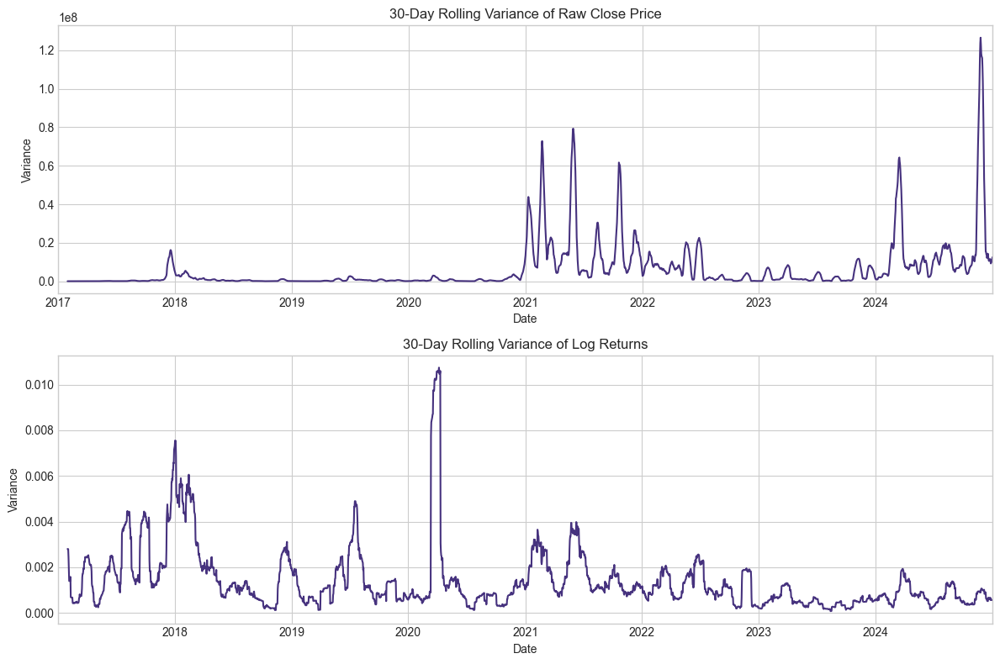

ARCH Test for Raw Price — statistic: 2898.1079, p-value: 0.0000
ARCH Test for Log Returns — statistic: 77.7191, p-value: 0.0000


In [100]:
# --- Skewness and Heteroscedasticity Analysis ---

# Compare skewness between raw price and log returns
raw_skewness = y.skew()
log_returns_skewness = btc_log_returns.skew()
print(f"Skewness of Raw Close Price: {raw_skewness:.4f}")
print(f"Skewness of Log Returns: {log_returns_skewness:.4f}")

# Compare heteroscedasticity between raw price and log returns
raw_rolling_var = y.rolling(window=30).var()
log_returns_rolling_var = btc_log_returns.rolling(window=30).var()

# Plot both rolling variances
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
raw_rolling_var.plot(ax=ax1, title='30-Day Rolling Variance of Raw Close Price')
ax1.set_xlabel('Date')
ax1.set_ylabel('Variance')

log_returns_rolling_var.plot(ax=ax2, title='30-Day Rolling Variance of Log Returns')
ax2.set_xlabel('Date')
ax2.set_ylabel('Variance')
plt.tight_layout()
plt.show()

# ARCH test for both series
raw_arch_stat, raw_arch_pvalue, _, _ = het_arch(y.dropna())
log_arch_stat, log_arch_pvalue, _, _ = het_arch(btc_log_returns.dropna())

print(f"ARCH Test for Raw Price — statistic: {raw_arch_stat:.4f}, p-value: {raw_arch_pvalue:.4f}")
print(f"ARCH Test for Log Returns — statistic: {log_arch_stat:.4f}, p-value: {log_arch_pvalue:.4f}")

In [65]:
# Descriptive Statistics for Log Returns
print("Descriptive Statistics for Log Returns:")
print(btc_log_returns.describe())
print(f"Skewness: {btc_log_returns.skew():.4f}")
print(f"Kurtosis: {btc_log_returns.kurtosis():.4f}") # Pandas kurtosis is excess kurtosis (0 for normal)

Descriptive Statistics for Log Returns:
count    2960.000000
mean        0.001628
std         0.037530
min        -0.464730
25%        -0.013786
50%         0.001387
75%         0.017801
max         0.225119
Name: btc_close, dtype: float64
Skewness: -0.6709
Kurtosis: 11.4272


In [15]:
# ---- Stationary Check ----
def check_stationarity_adf(series, series_name="Time Series", alpha=0.05):
    """
    Performs the Augmented Dickey-Fuller (ADF) test to check for stationarity
    and provides a clear interpretation of the results.

    Args:
        series (pd.Series): The time series data to test.
        series_name (str): A descriptive name for the time series (for printing).
        alpha (float): The significance level for the test (e.g., 0.05 for 5% significance).
    """
    
    # Handle potential NaNs in the series, as adfuller can be sensitive
    series_cleaned = series.dropna()
    if series_cleaned.empty:
        print(f"The series '{series_name}' is empty after removing NaNs. Cannot perform ADF test.")
        return

    print(f"--- Augmented Dickey-Fuller Test for Stationarity: '{series_name}' ---")
    print(f"Null Hypothesis (H0): The series has a unit root (it is non-stationary).")
    print(f"Alternative Hypothesis (H1): The series does not have a unit root (it is stationary).\n")

    # Perform the ADF test
    # autolag='AIC' allows the test to automatically find the optimal number of lags based on AIC
    dftest = adfuller(series_cleaned, autolag='AIC')

    # Extract and print results
    adf_statistic = dftest[0]
    p_value = dftest[1]
    num_lags_used = dftest[2]
    num_observations = dftest[3]
    critical_values = dftest[4]

    print(f"ADF Test Statistic:          {adf_statistic:.4f}")
    print(f"P-value:                     {p_value:.4f}")
    print(f"Number of Lags Used:         {num_lags_used}")
    print(f"Number of Observations Used: {num_observations}\n")

    print("Critical Values:")
    for k, v in critical_values.items():
        print(f"\t{k}: {v:.4f}")
    print("---" * 20)

    # Interpretation based on p-value
    print("\nInterpretation:")
    if p_value <= alpha:
        print(f"Based on the p-value ({p_value:.4f} <= {alpha}), we REJECT the Null Hypothesis (H0).")
        print(f"Conclusion: The series '{series_name}' is LIKELY STATIONARY at the {alpha*100:.0f}% significance level.")
    else:
        print(f"Based on the p-value ({p_value:.4f} > {alpha}), we FAIL TO REJECT the Null Hypothesis (H0).")
        print(f"Conclusion: The series '{series_name}' is LIKELY NON-STATIONARY at the {alpha*100:.0f}% significance level.")

    # Interpretation based on Test Statistic vs Critical Values (provides more nuance)
    print("\nComparing Test Statistic to Critical Values:")
    is_stationary_at_any_level = False
    for k, v in critical_values.items():
        if adf_statistic < v:
            print(f"\tTest Statistic ({adf_statistic:.4f}) < Critical Value at {k} ({v:.4f}). "
                  f"Indicates stationarity at the {k} significance level.")
            is_stationary_at_any_level = True
        else:
            print(f"\tTest Statistic ({adf_statistic:.4f}) >= Critical Value at {k} ({v:.4f}). "
                  f"Does not indicate stationarity at the {k} significance level.")
    
    if not is_stationary_at_any_level and p_value > alpha:
         print(f"\nOverall, the ADF Test Statistic ({adf_statistic:.4f}) is not more negative than the critical values, "
               "supporting the conclusion of non-stationarity.")
    elif is_stationary_at_any_level and p_value <= alpha:
         print(f"\nOverall, the ADF Test Statistic ({adf_statistic:.4f}) is more negative than one or more critical values, "
               "supporting the conclusion of stationarity.")
    print("---" * 20 + "\n")


check_stationarity_adf(df[target_variable], series_name="Bitcoin Close Price")

# You can also test with a different significance level:
# check_stationarity_adf(df[target_variable], series_name="Bitcoin Close Price", alpha=0.01)

--- Augmented Dickey-Fuller Test for Stationarity: 'Bitcoin Close Price' ---
Null Hypothesis (H0): The series has a unit root (it is non-stationary).
Alternative Hypothesis (H1): The series does not have a unit root (it is stationary).

ADF Test Statistic:          -0.4389
P-value:                     0.9034
Number of Lags Used:         28
Number of Observations Used: 2893

Critical Values:
	1%: -3.4326
	5%: -2.8625
	10%: -2.5673
------------------------------------------------------------

Interpretation:
Based on the p-value (0.9034 > 0.05), we FAIL TO REJECT the Null Hypothesis (H0).
Conclusion: The series 'Bitcoin Close Price' is LIKELY NON-STATIONARY at the 5% significance level.

Comparing Test Statistic to Critical Values:
	Test Statistic (-0.4389) >= Critical Value at 1% (-3.4326). Does not indicate stationarity at the 1% significance level.
	Test Statistic (-0.4389) >= Critical Value at 5% (-2.8625). Does not indicate stationarity at the 5% significance level.
	Test Statistic 

In [16]:
check_stationarity_adf(btc_log_returns, series_name="Bitcoin Log Returns")

--- Augmented Dickey-Fuller Test for Stationarity: 'Bitcoin Log Returns' ---
Null Hypothesis (H0): The series has a unit root (it is non-stationary).
Alternative Hypothesis (H1): The series does not have a unit root (it is stationary).

ADF Test Statistic:          -37.3121
P-value:                     0.0000
Number of Lags Used:         1
Number of Observations Used: 2919

Critical Values:
	1%: -3.4326
	5%: -2.8625
	10%: -2.5673
------------------------------------------------------------

Interpretation:
Based on the p-value (0.0000 <= 0.05), we REJECT the Null Hypothesis (H0).
Conclusion: The series 'Bitcoin Log Returns' is LIKELY STATIONARY at the 5% significance level.

Comparing Test Statistic to Critical Values:
	Test Statistic (-37.3121) < Critical Value at 1% (-3.4326). Indicates stationarity at the 1% significance level.
	Test Statistic (-37.3121) < Critical Value at 5% (-2.8625). Indicates stationarity at the 5% significance level.
	Test Statistic (-37.3121) < Critical Value

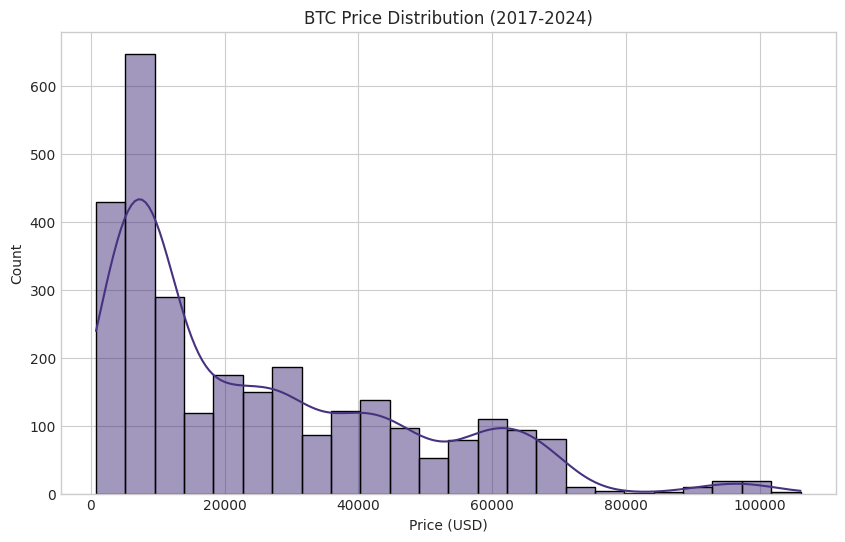

Skewness of BTC Price: 1.0469854002765513


In [13]:
# Distribution Plot
# - skewness
# - kurtosis
#  -> need transform
plt.figure(figsize=(10, 6))
sns.histplot(df[target_variable], kde=True)
plt.title('BTC Price Distribution (2017-2024)')
plt.xlabel('Price (USD)')
plt.show()
print(f"Skewness of BTC Price: {df[target_variable].skew()}")

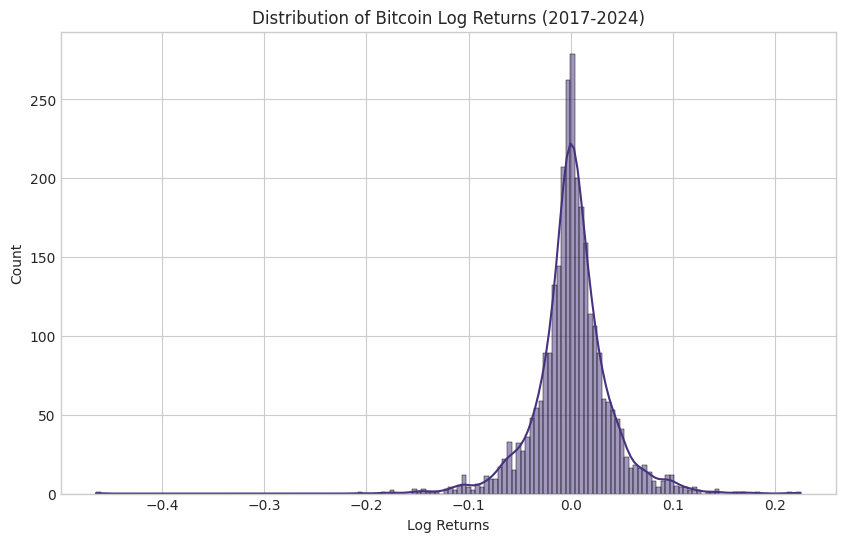

Skewness of Log Returns: -0.6673074088248906
Kurtosis of Log Returns: 11.353577223067248


In [18]:
plt.figure(figsize=(10, 6))
sns.histplot(btc_log_returns, kde=True)
plt.title('Distribution of Bitcoin Log Returns (2017-2024)')
plt.xlabel('Log Returns')
plt.show()
print(f"Skewness of Log Returns: {btc_log_returns.skew()}")
print(f"Kurtosis of Log Returns: {btc_log_returns.kurtosis()}")


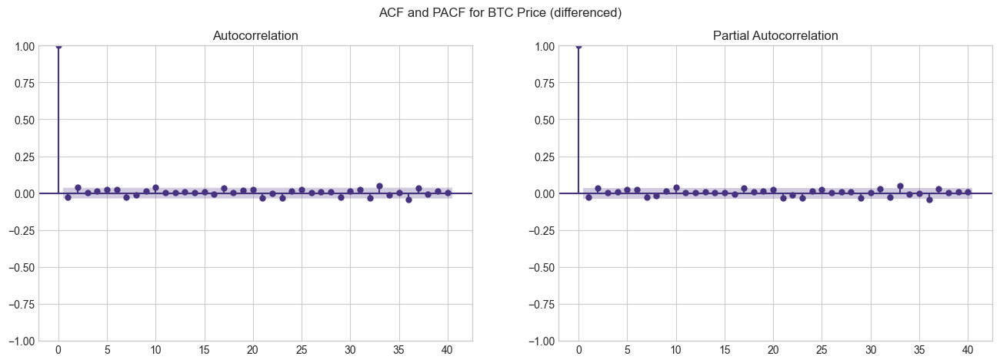

In [62]:
# Autocorrelation (ACF) and Partial Autocorrelation (PACF) Plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
plot_acf(btc_log_returns, ax=axes[0], lags=40) # Adjust lags as needed
plot_pacf(btc_log_returns, ax=axes[1], lags=40) # Adjust lags as needed
plt.suptitle('ACF and PACF for BTC Price (differenced)')
plt.show()

# after lag 0, all spikes are within the blue significance bands, indicating no statistically 
# autocorrelation n the differenced series.

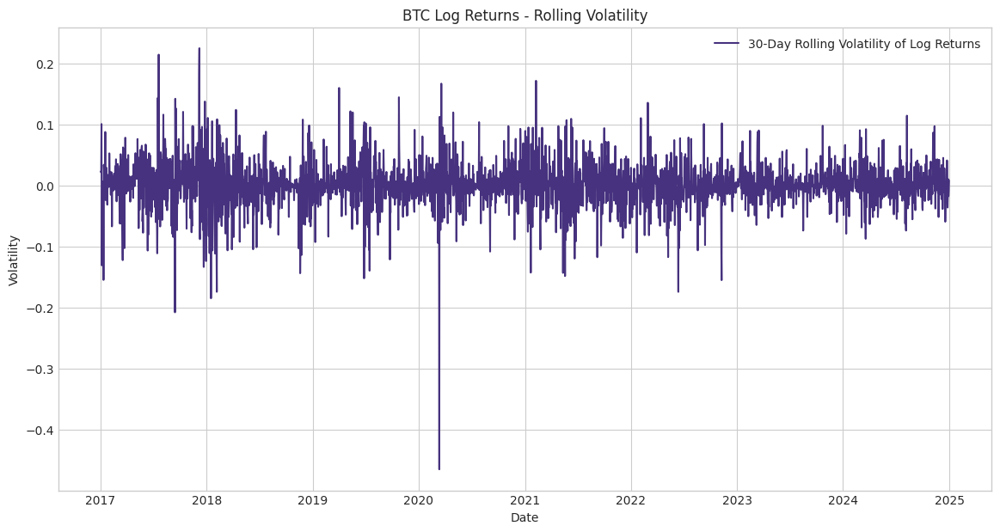

In [17]:
rolling_volatility = btc_log_returns.rolling(window=30).std() * np.sqrt(30) # Annualize if desired (e.g., * sqrt(252) for daily to annual)

plt.figure(figsize=(14, 7))
plt.plot(rolling_volatility.index, rolling_volatility, label='30-Day Rolling Volatility of Log Returns')
plt.title('BTC Log Returns - Rolling Volatility')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.legend()
plt.show()

# period of high volatility around 2020

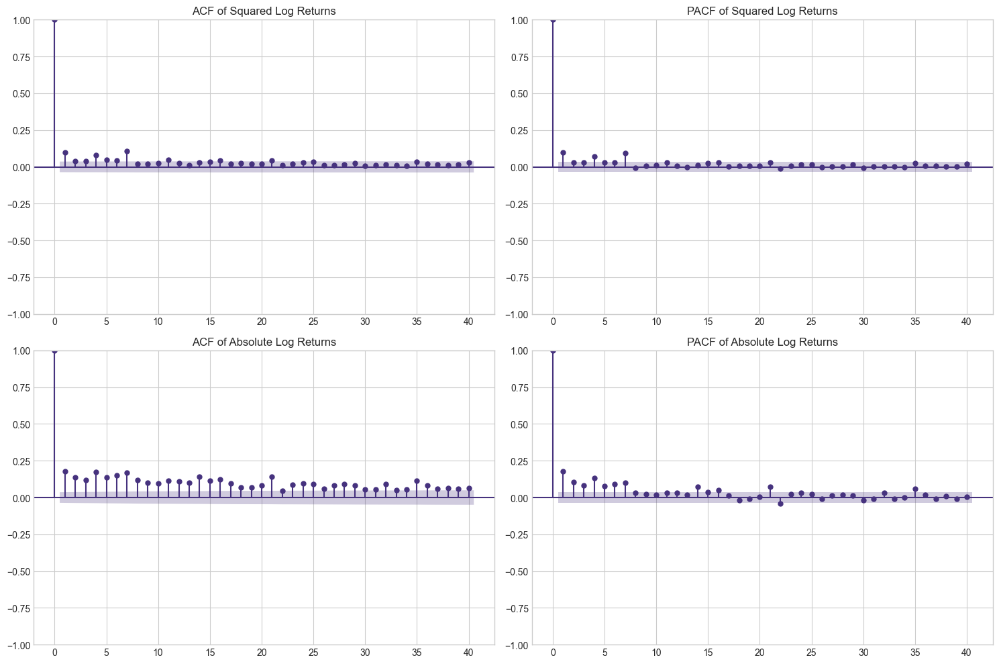

In [76]:
# ACF and PACF of Squared and Absolute Log Returns
squared_log_returns = btc_log_returns**2
absolute_log_returns = btc_log_returns.abs()

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
plot_acf(squared_log_returns, ax=axes[0,0], title='ACF of Squared Log Returns', lags=40)
plot_pacf(squared_log_returns, ax=axes[0,1], title='PACF of Squared Log Returns', lags=40, method='ywm')
plot_acf(absolute_log_returns, ax=axes[1,0], title='ACF of Absolute Log Returns', lags=40)
plot_pacf(absolute_log_returns, ax=axes[1,1], title='PACF of Absolute Log Returns', lags=40, method='ywm')
plt.tight_layout()
plt.show()
# These plots together provide strong evidence of volatility clustering (ARCH or GARCH effects). 
# The significant autocorrelations in these transformed series 
# (squared or absolute returns, which are proxies for variance/volatility) confirm that 
# Bitcoin's volatility is predictable based on past volatility. 
# This is a more formal confirmation of what the rolling volatility plot suggested visually

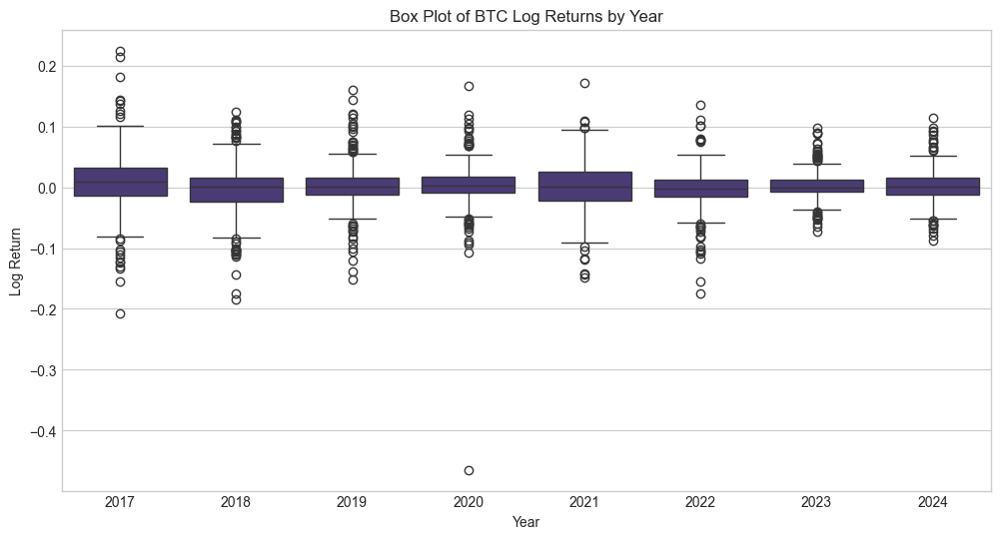

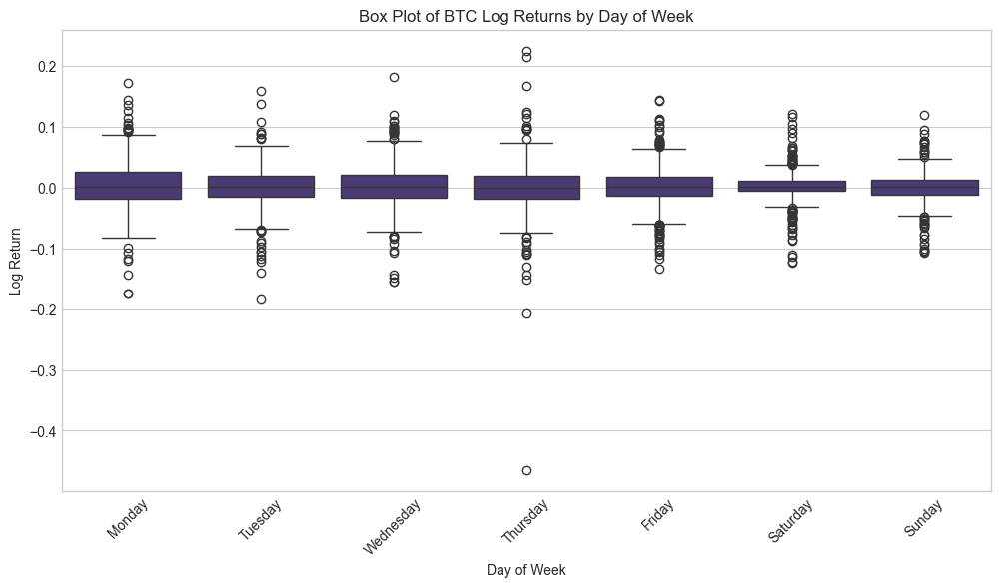

In [91]:

plt.figure(figsize=(12, 6))
sns.boxplot(x=btc_log_returns.index.year, y=btc_log_returns)
plt.title('Box Plot of BTC Log Returns by Year')
plt.xlabel('Year')
plt.ylabel('Log Return')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x=btc_log_returns.index.day_name(), y=btc_log_returns, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Box Plot of BTC Log Returns by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Log Return')
plt.xticks(rotation=45)
plt.show()

# The size of the boxes (Interquartile Range) and the length of the whiskers vary noticeably from year to year. For example, 2017, 2020, and 2021 show wider boxes and/or longer whiskers, indicating higher volatility or a wider range of returns during those years compared to others like 2016, 2019 or 2023.
# Numerous outliers (the circles) are present in almost every year, both positive and negative. This indicates that extreme daily returns ("fat tails") occur more frequently than would be expected under a normal distribution. The year 2020 notably shows a very large negative outlier

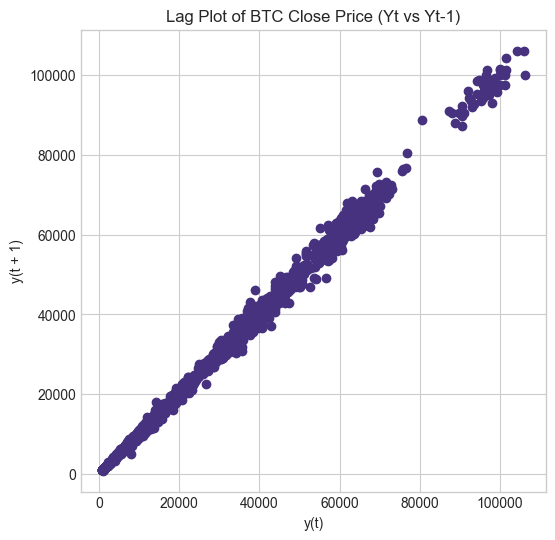

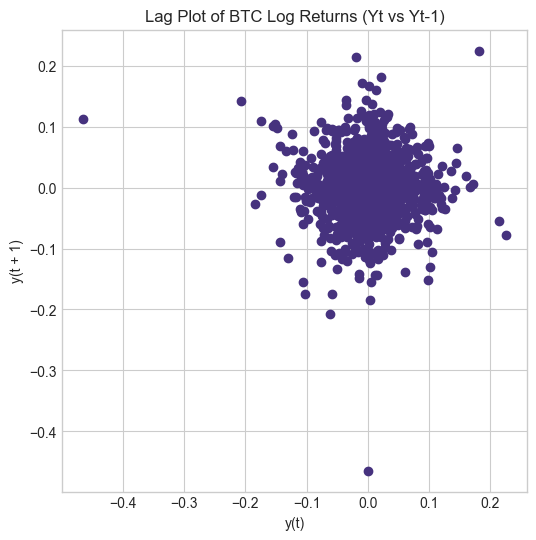

In [92]:
from pandas.plotting import lag_plot

plt.figure(figsize=(6,6))
lag_plot(df[target_variable]) # For raw price
plt.title('Lag Plot of BTC Close Price (Yt vs Yt-1)')
plt.show()

plt.figure(figsize=(6,6))
lag_plot(btc_log_returns) # For log returns
plt.title('Lag Plot of BTC Log Returns (Yt vs Yt-1)')
plt.show()

## Correlation Analysis

In [40]:
feature_groups = {
    "CBBI Features": cbbi_features,
    "Blockchain Features": blockchain_features,
    "Cross Market Features": cross_market_features,
    "Technical Indicator Features": technical_indicator_features,
    "Sentiment Features": sentiment_features
}

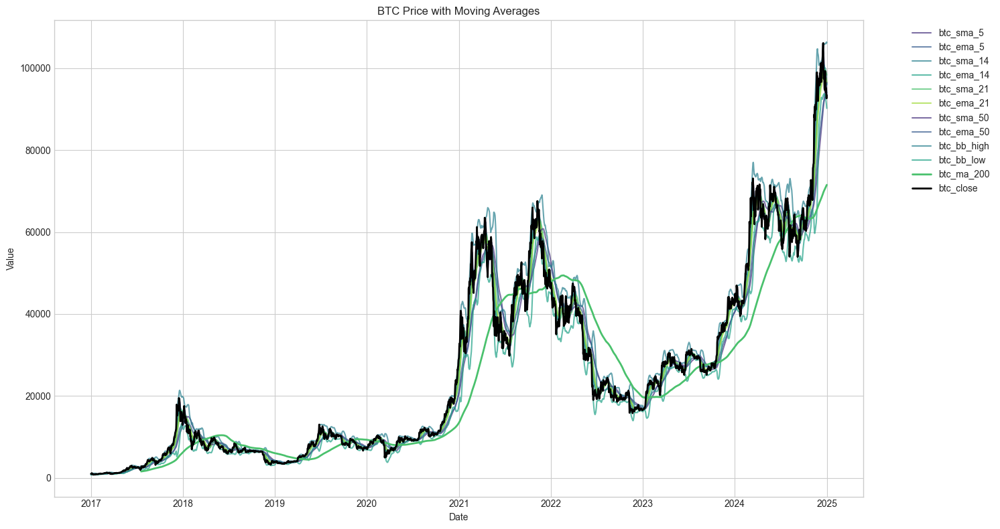

In [93]:
# technical_indicator_features
plt.figure(figsize=(15, 8))
for feature in [f for f in technical_indicator_features if f.startswith(('btc_sma', 'btc_ema', 'btc_bb_high', 'btc_bb_low')) and 'diff' not in f and 'ratio' not in f and 'slope' not in f]:
    plt.plot(df.index, df[feature], label=feature, alpha=0.7)
plt.plot(df.index, df[target_variable].rolling(window=200).mean(), label='btc_ma_200', linewidth=2)
plt.plot(df.index, df[target_variable], label=target_variable, linewidth=2, color='black')
plt.title('BTC Price with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


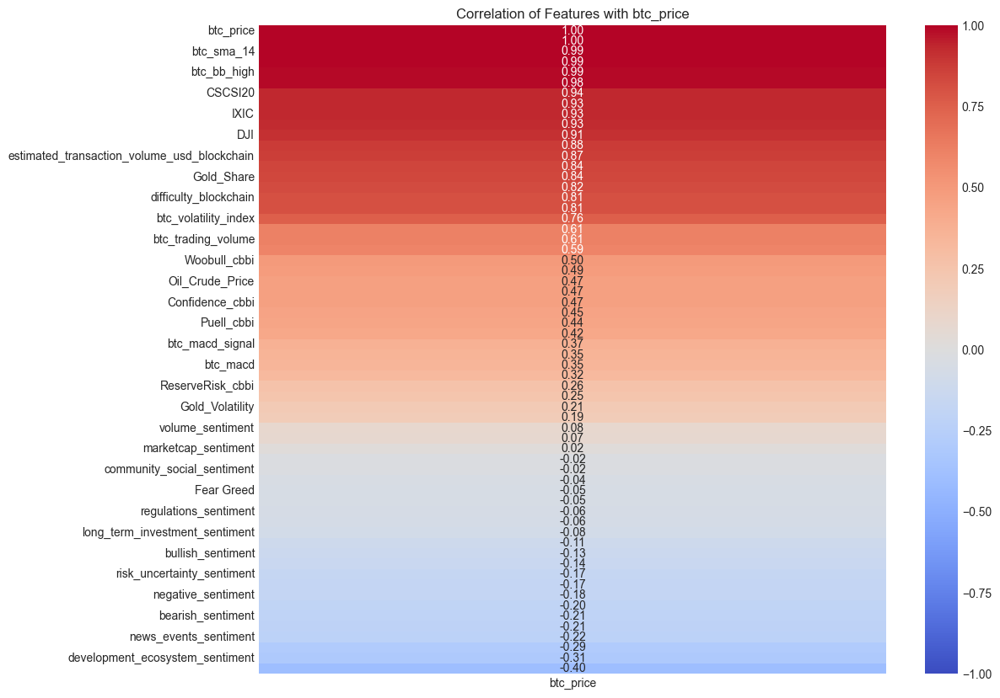

In [13]:
# HEATMAP
plt.figure(figsize=(12, 10))
sns.heatmap(df[all_features + [target_variable]].corr()[[target_variable]].sort_values(by=target_variable, ascending=False),
            annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title(f'Correlation of Features with {target_variable}')
plt.show()

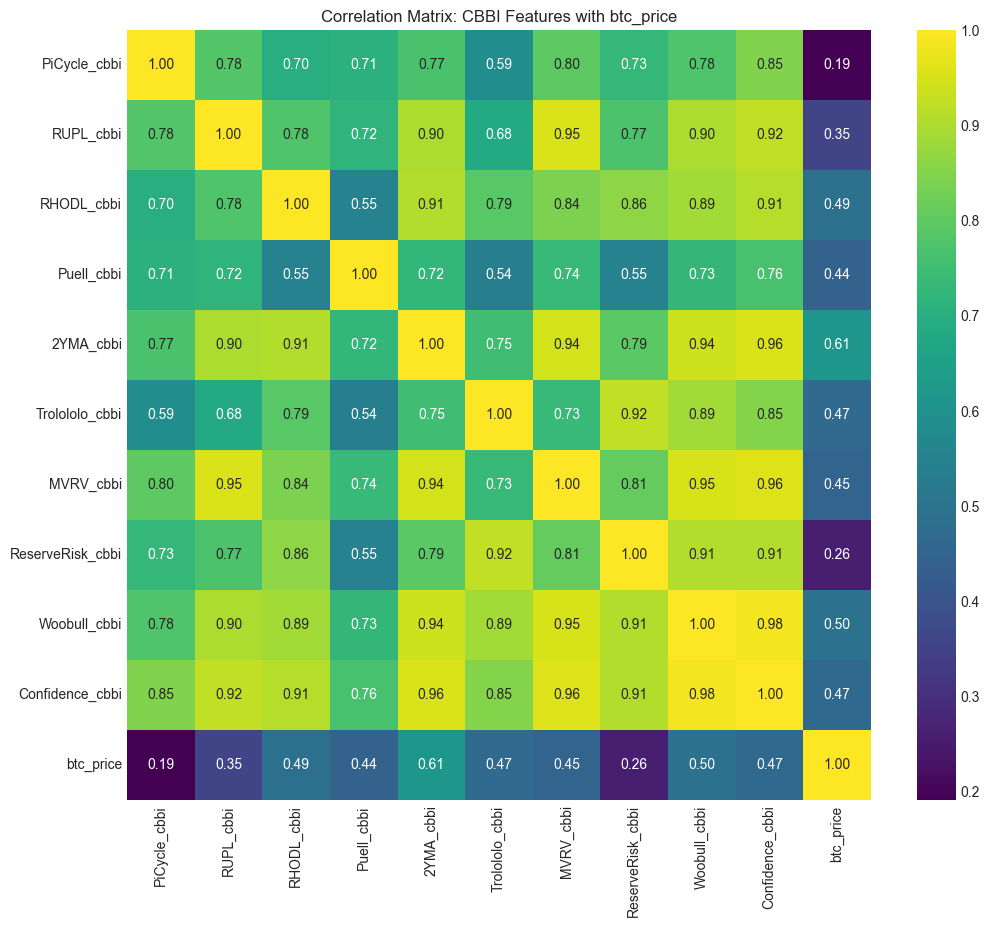

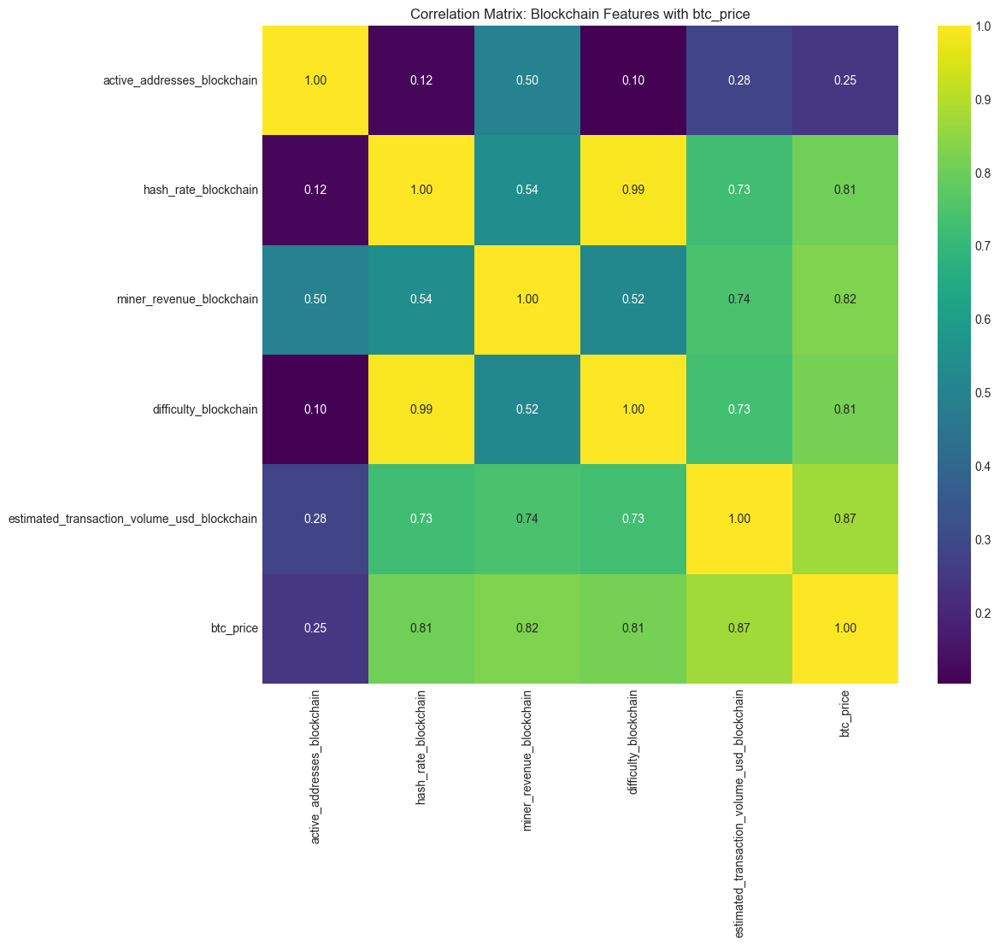

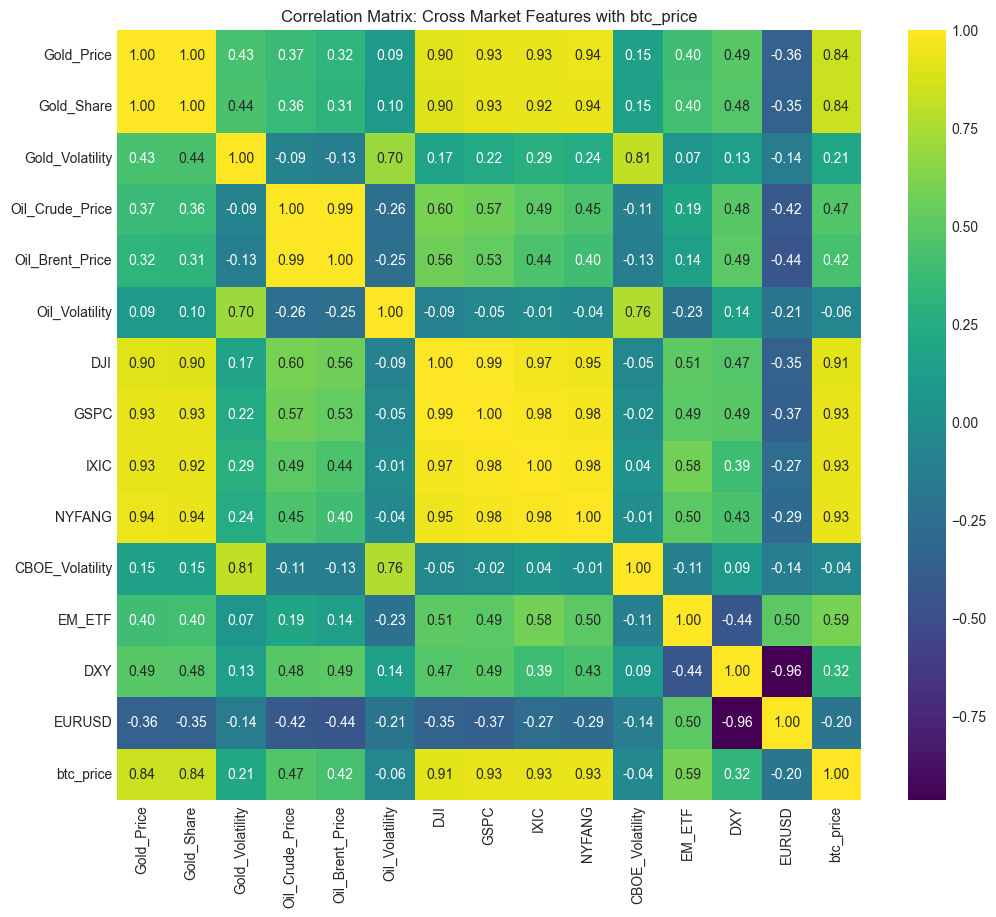

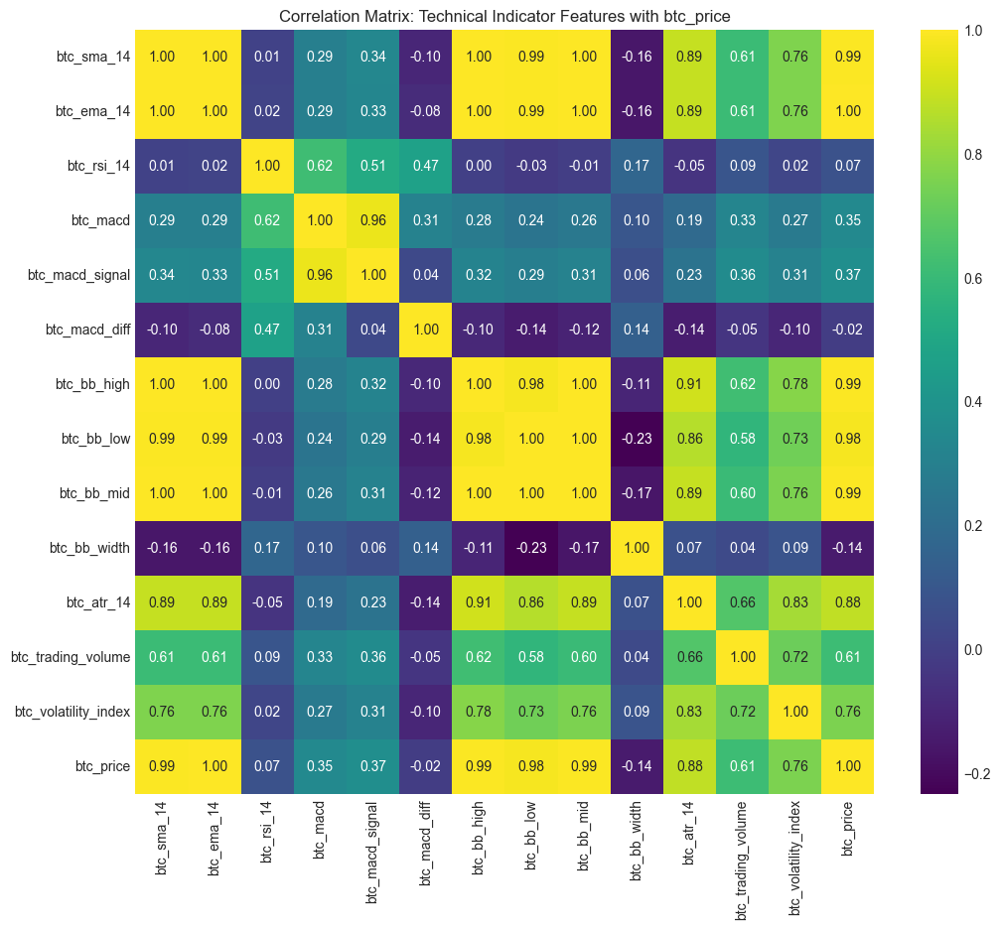

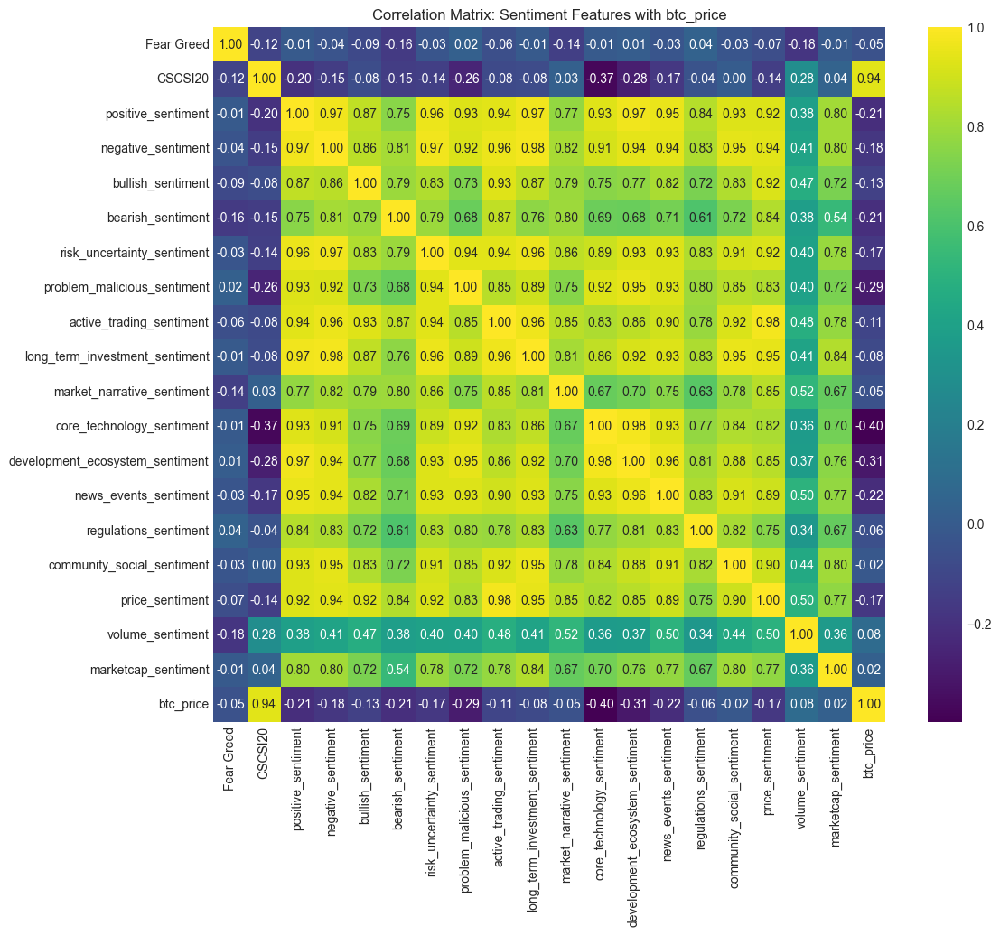

In [7]:
# HEATMAP
for group_name, features in feature_groups.items():
    if len(features) > 0:
        plt.figure(figsize=(12, 10))
        features_with_target = features + [target_variable]
        sns.heatmap(df[features_with_target].corr(), annot=True, cmap='viridis', fmt=".2f")
        plt.title(f'Correlation Matrix: {group_name} with {target_variable}')
        plt.show()

In [5]:
correlations_with_target = df[cross_market_features + [target_variable]].corr()[target_variable].sort_values(ascending=False)
# print("--- Top 15 features correlated with BTC Price ---")
# print(correlations_with_target.head(15))
# print("\n--- Bottom 15 features correlated with BTC Price (most negative or least correlated) ---")
# print(correlations_with_target.tail(15)[::-1])
correlations_with_target.drop(target_variable)
# plt.figure(figsize=(10, 12)) # Adjust size based on number of features
# sns.barplot(x=correlations_with_target.drop(target_variable).values, y=correlations_with_target.drop(target_variable).index)
# plt.title('Feature Correlation with BTC Price')
# plt.xlabel('Correlation Coefficient')
# plt.show()

IXIC               0.931341
NYFANG             0.931174
GSPC               0.925774
DJI                0.907339
Gold_Price         0.844037
Gold_Share         0.841881
EM_ETF             0.614227
Oil_Crude_Price    0.477396
Oil_Brent_Price    0.435193
DXY                0.290856
Gold_Volatility    0.215096
CBOE_Volatility   -0.022385
Oil_Volatility    -0.048740
EURUSD            -0.155387
Name: btc_close, dtype: float64

In [6]:
import matplotlib.dates as mdates

def plot_feature_vs_target(df, feature_name, target_name='btc_close'):
    """Plots a feature and the target on dual axes or normalized with year-only x-axis formatting."""
    if feature_name not in df.columns or target_name not in df.columns:
        print(f"Warning: {feature_name} or {target_name} not in DataFrame columns.")
        return
    
    # 🔒 Ensure index is datetime
    if not pd.api.types.is_datetime64_any_dtype(df.index):
        df = df.copy()
        df.index = pd.to_datetime(df.index)

    fig, ax1 = plt.subplots(figsize=(14, 7))
    
    color = 'tab:red'
    ax1.set_xlabel('Date')
    ax1.set_ylabel(target_name, color=color)
    ax1.plot(df.index, df[target_name], color=color, label=target_name)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel(feature_name, color=color)
    ax2.plot(df.index, df[feature_name], color=color, label=feature_name, alpha=0.7)
    ax2.tick_params(axis='y', labelcolor=color)

    # Format x-axis ticks to show only the year
    ax1.xaxis.set_major_locator(mdates.YearLocator())  # set major ticks every year
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # format ticks to show only the year

    plt.xticks(rotation=45)
    plt.title(f'{target_name} vs. {feature_name}')
    fig.tight_layout()  # adjust layout to prevent clipping
    plt.show()


Top 3 Positive Correlations:
IXIC: 0.931


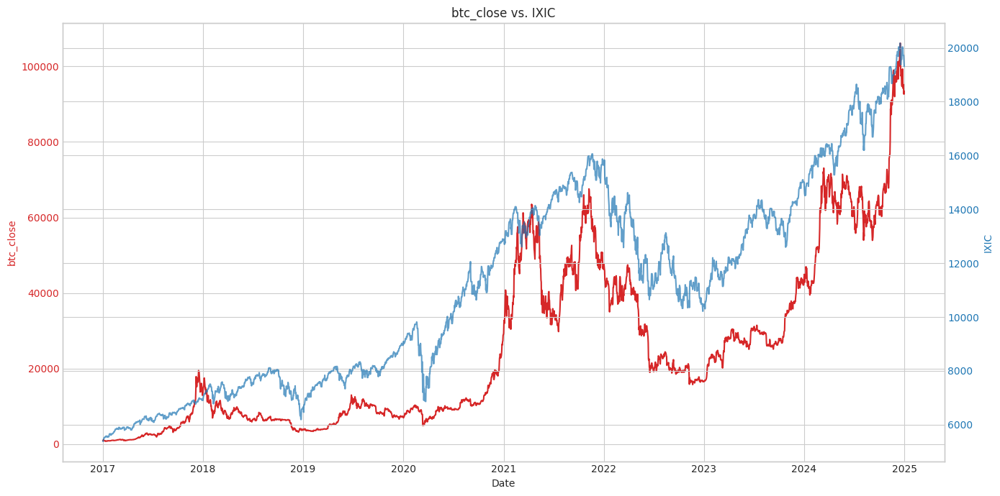

NYFANG: 0.931


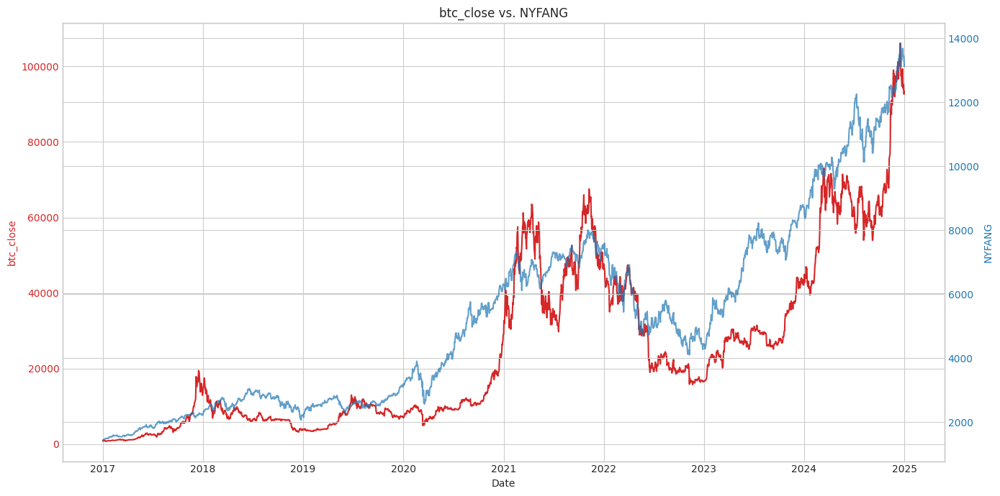

GSPC: 0.926


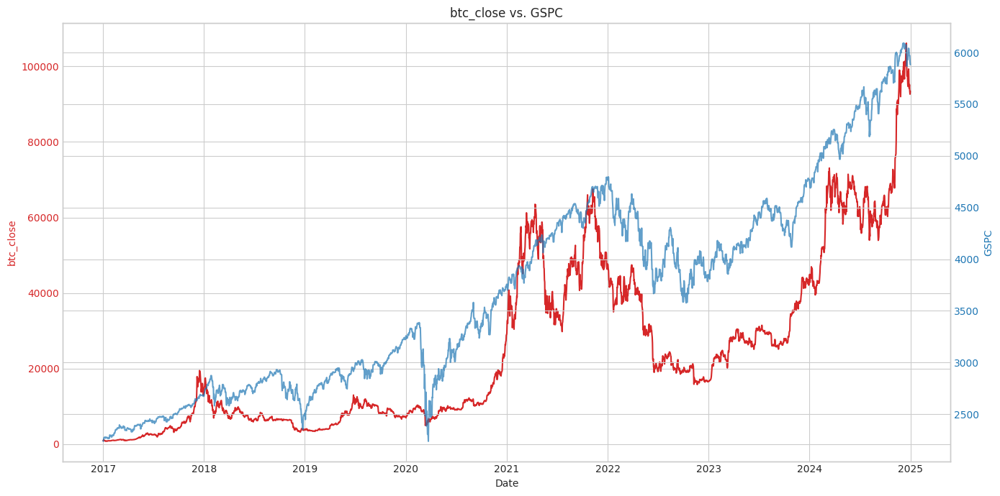

In [12]:
# Print top 3 positive and negative correlations and plot them
top_pos = correlations_with_target.nlargest(4).index.tolist()
top_neg = correlations_with_target.nsmallest(3).index.tolist()

print("\nTop 3 Positive Correlations:")
for feature in top_pos:
    if feature != target_variable:
        print(f"{feature}: {correlations_with_target[feature]:.3f}")
        plot_feature_vs_target(df, feature, target_variable)

# print("\nTop 3 Negative Correlations:") 
# for feature in top_neg:
#     if feature != target_variable:
#         print(f"{feature}: {correlations_with_target[feature]:.3f}")
#         plot_feature_vs_target(df, feature, target_variable)

## Scatter Plots of Key Features vs. Target


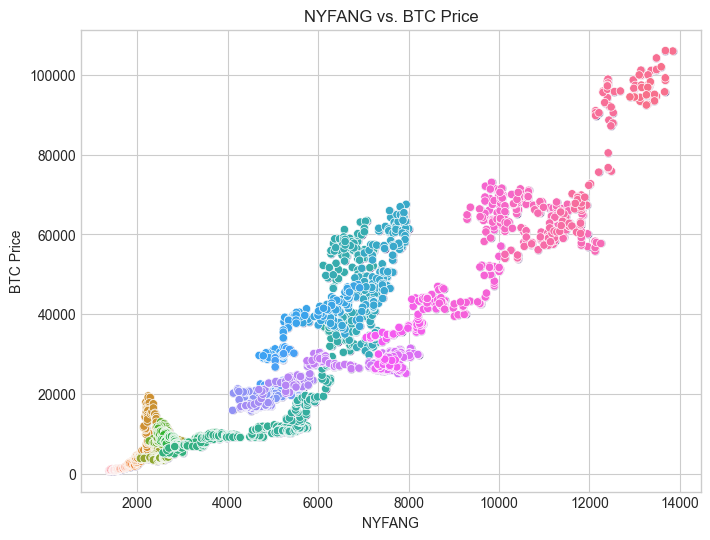

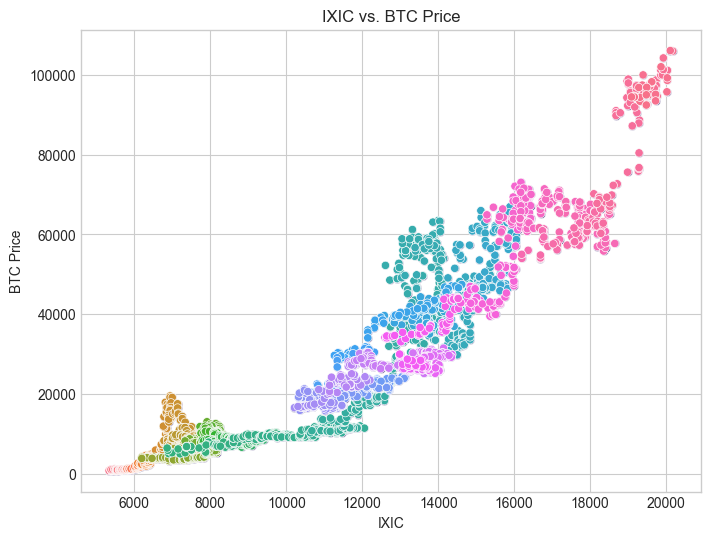

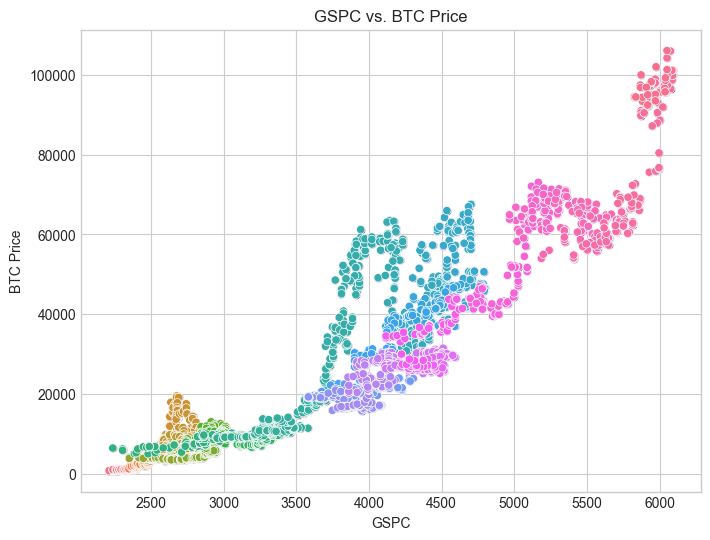

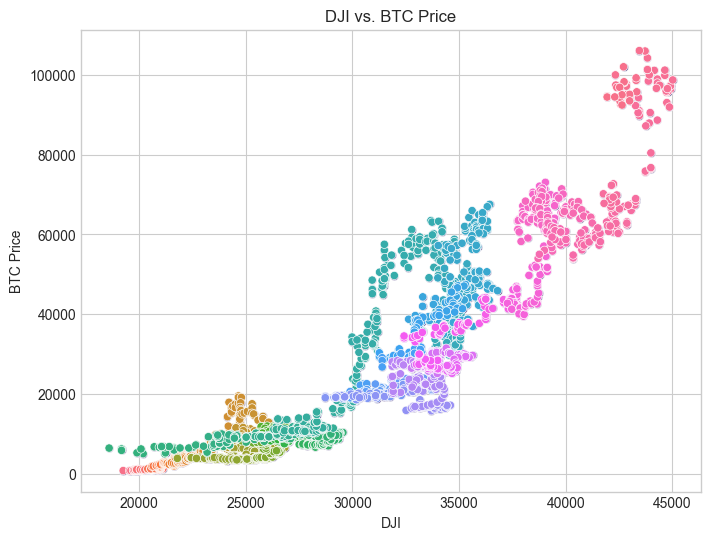

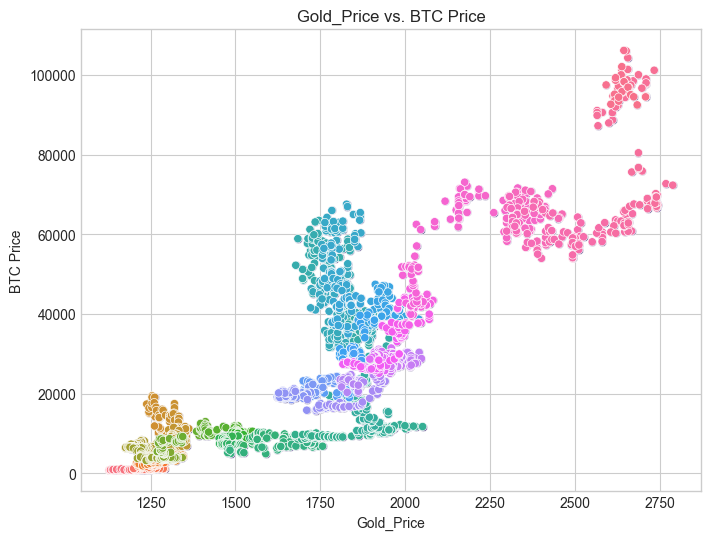

...

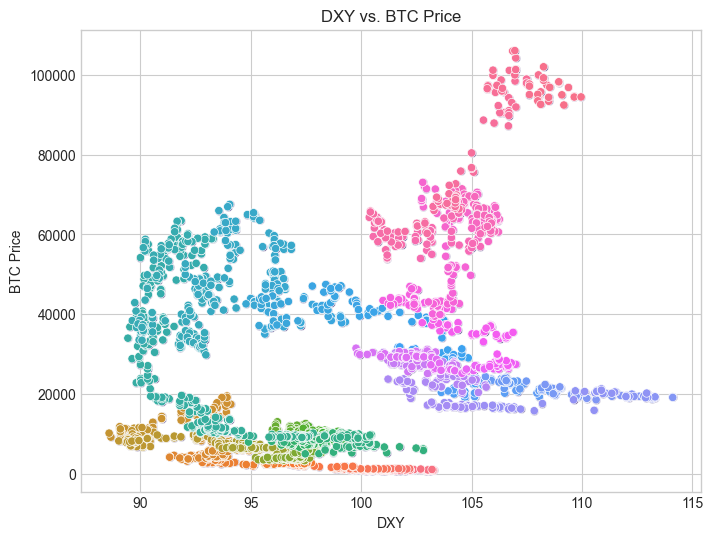

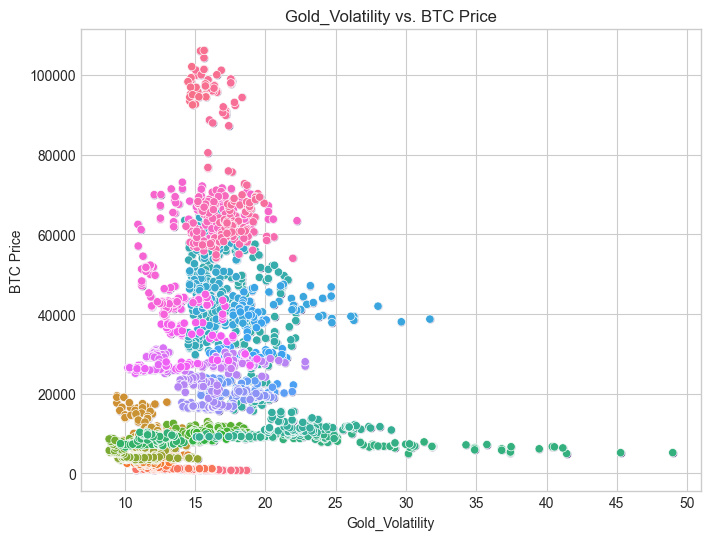

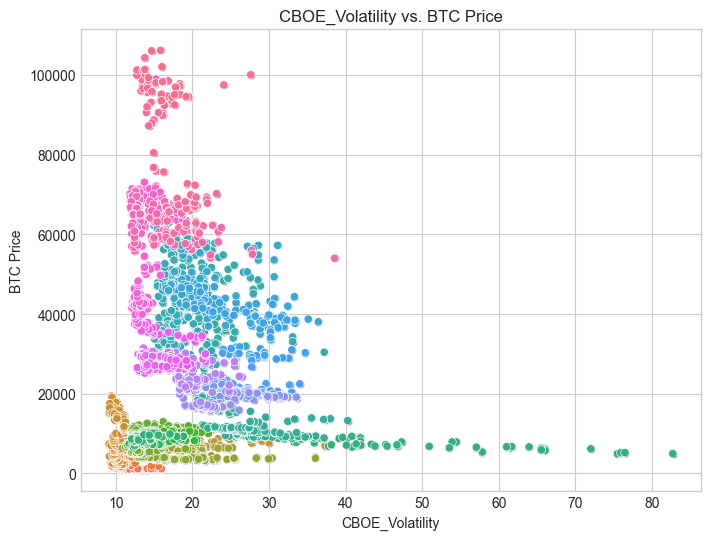

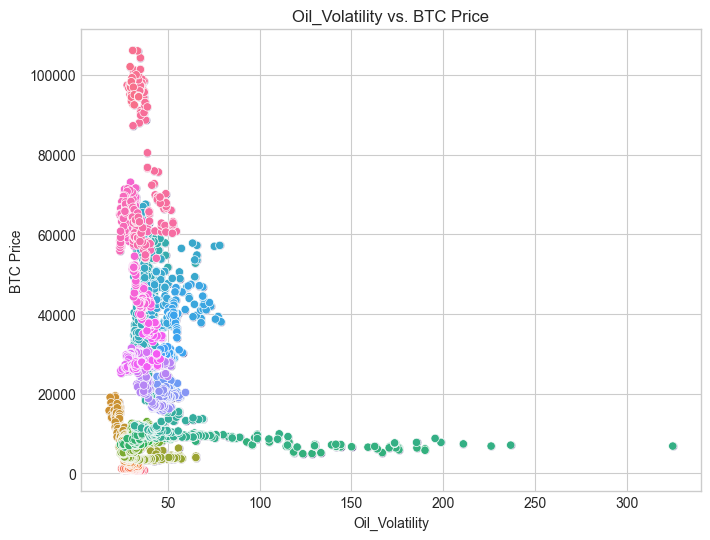

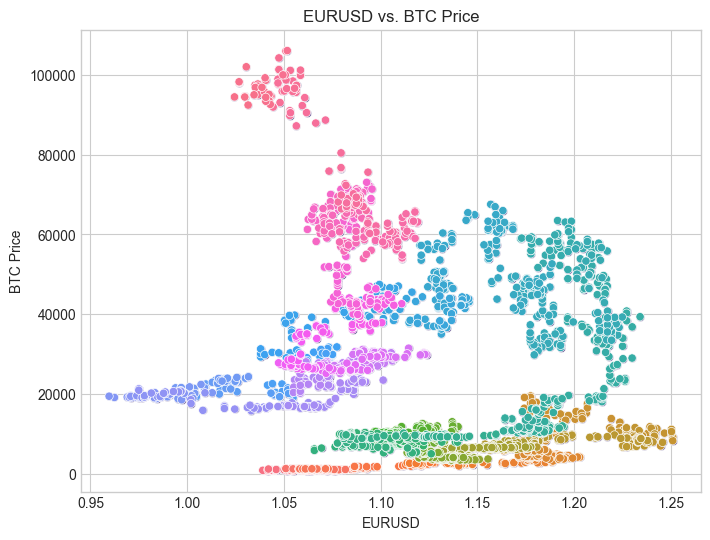

In [51]:
top_features = correlations_with_target.index.tolist()
bottom_features = correlations_with_target.tail(5)[::-1].index.tolist()
top_features = [f for f in top_features if f != target_variable]
bottom_features = [f for f in bottom_features if f != target_variable]


for feature in top_features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df[feature], y=df[target_variable])
    sns.scatterplot(x=df[feature], y=df[target_variable], hue=df.index, legend=None)
    plt.title(f'{feature} vs. BTC Price')
    plt.xlabel(feature)
    plt.ylabel('BTC Price')
    plt.show()


--- Analysis of CBBI Features ---

Descriptive Statistics for CBBI Features:
                   count      mean       std     min       25%      50%  \
PiCycle_cbbi      2900.0  0.529240  0.261478  0.0000  0.340025  0.54220   
RUPL_cbbi         2900.0  0.679886  0.226806  0.0000  0.571975  0.72975   
RHODL_cbbi        2900.0  0.435046  0.316946  0.0000  0.133700  0.41530   
Puell_cbbi        2900.0  0.532830  0.238817  0.0000  0.359875  0.52350   
2YMA_cbbi         2900.0  0.508401  0.264631  0.0000  0.325175  0.48120   
Trolololo_cbbi    2900.0  0.383393  0.245106  0.0000  0.182175  0.36990   
MVRV_cbbi         2900.0  0.513454  0.263922  0.0000  0.324500  0.52115   
ReserveRisk_cbbi  2900.0  0.435449  0.260730  0.0000  0.241475  0.42575   
Woobull_cbbi      2900.0  0.453478  0.229179  0.0000  0.300200  0.43670   
Confidence_cbbi   2900.0  0.496798  0.230540  0.0216  0.344575  0.48940   

                       75%     max  
PiCycle_cbbi      0.707200  0.9999  
RUPL_cbbi         0.85

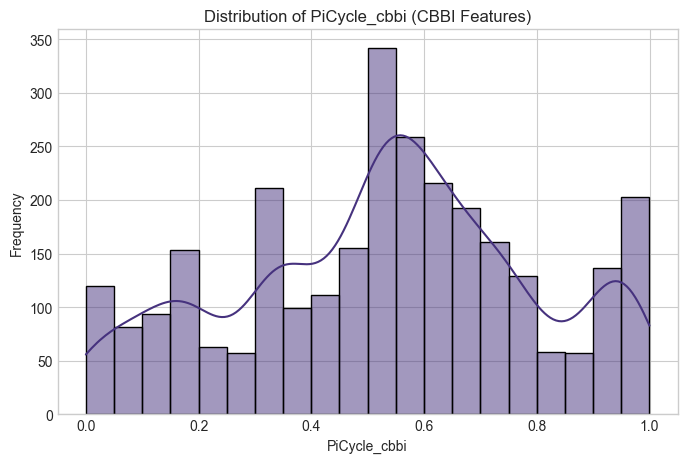

Interpretation: The histogram for PiCycle_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


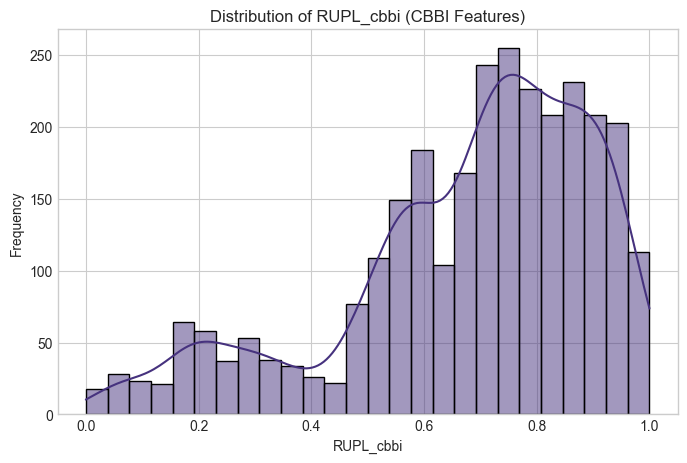

Interpretation: The histogram for RUPL_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


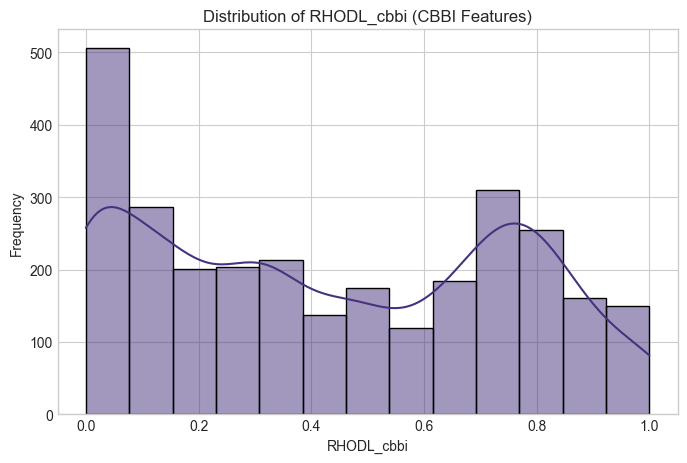

Interpretation: The histogram for RHODL_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


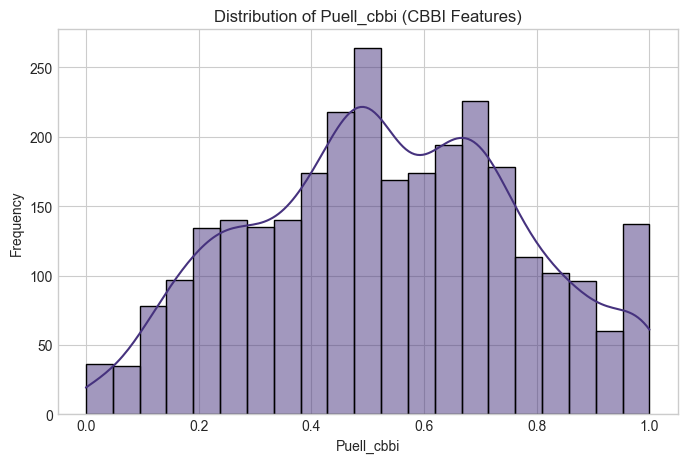

Interpretation: The histogram for Puell_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


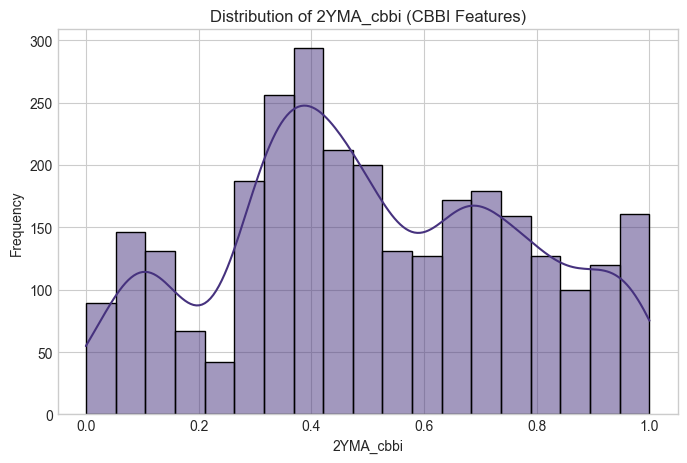

Interpretation: The histogram for 2YMA_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


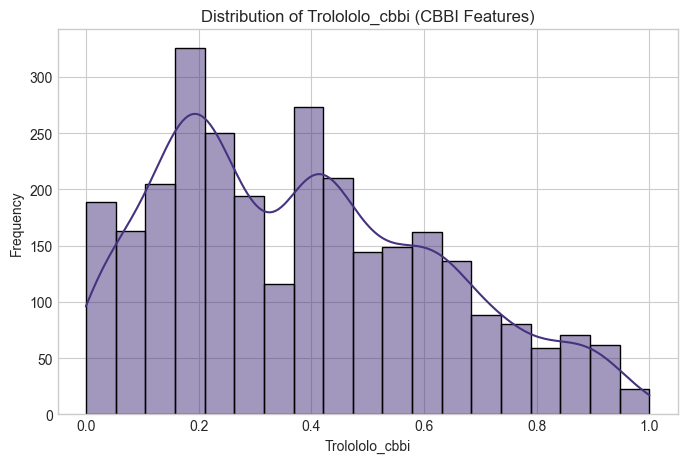

Interpretation: The histogram for Trolololo_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


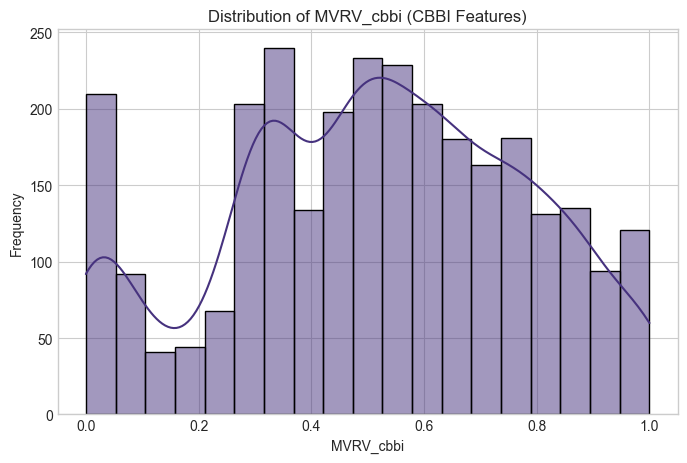

Interpretation: The histogram for MVRV_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


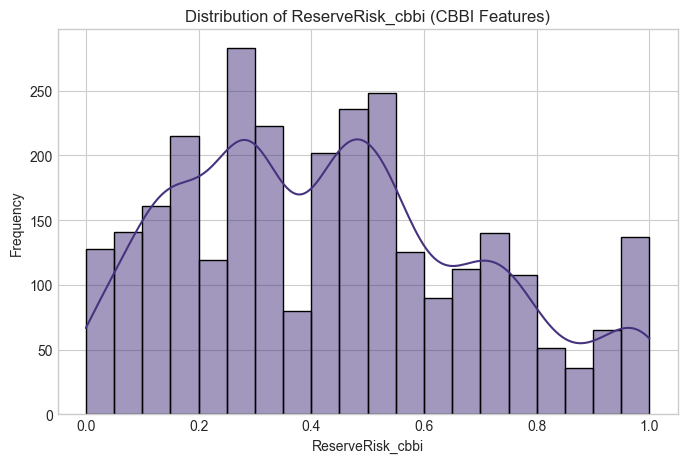

Interpretation: The histogram for ReserveRisk_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


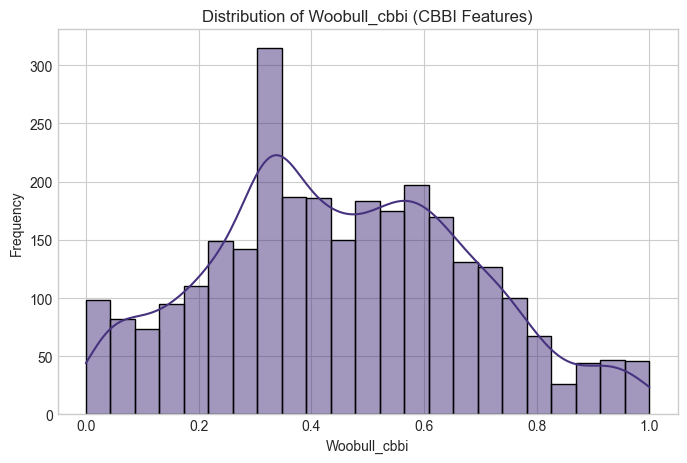

Interpretation: The histogram for Woobull_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


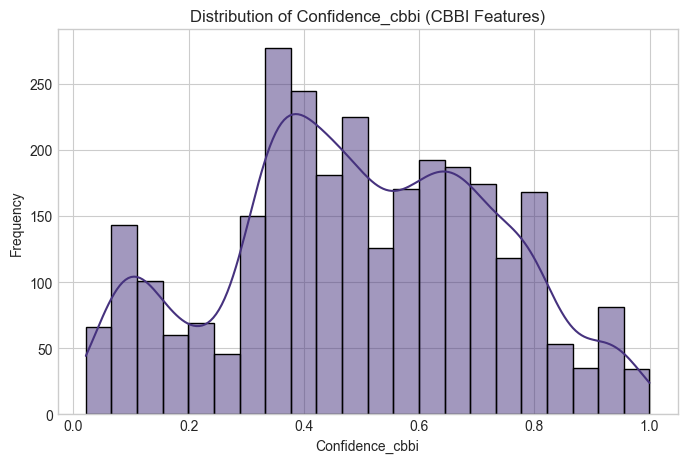

Interpretation: The histogram for Confidence_cbbi shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.

Correlation Analysis for CBBI Features:


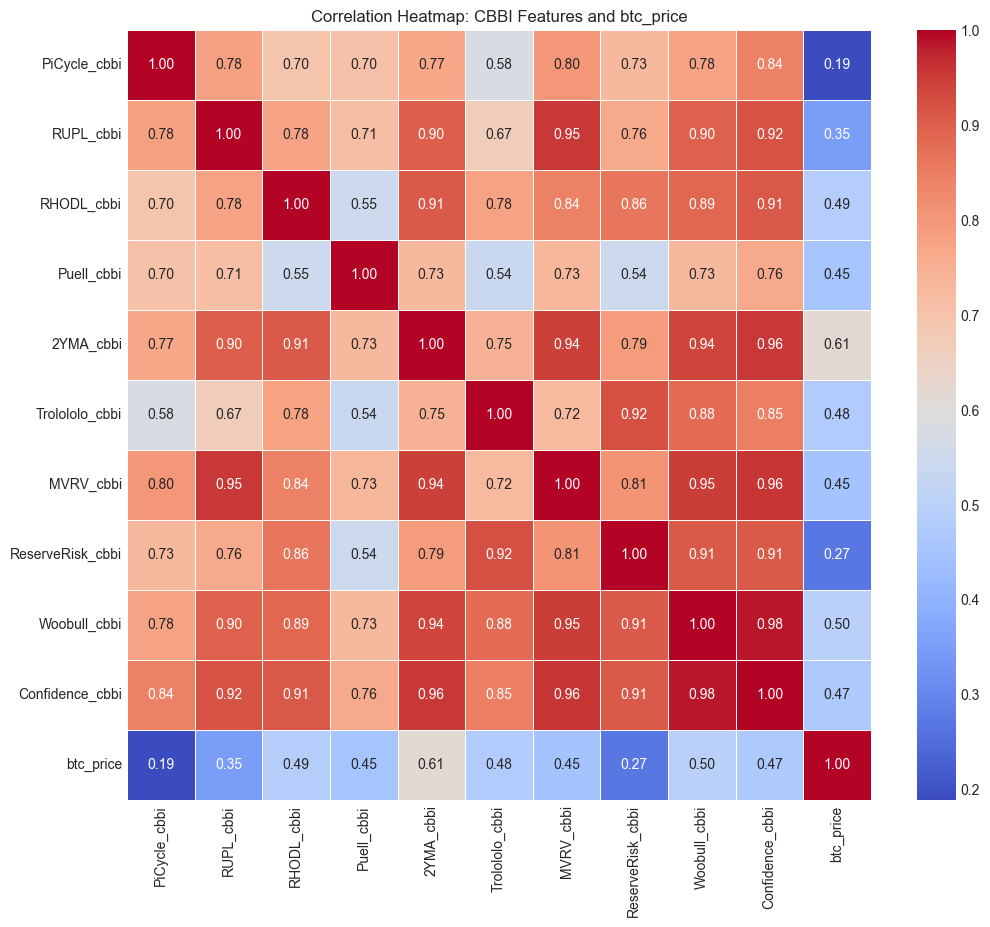

Interpretation: The heatmap shows linear correlations. Values close to +1 or -1 indicate strong positive or negative linear relationships, respectively. Values close to 0 suggest weak linear relationships. Pay attention to correlations between features (multicollinearity) and between features and 'btc_price'.

Scatter Plots for CBBI Features vs. btc_price:


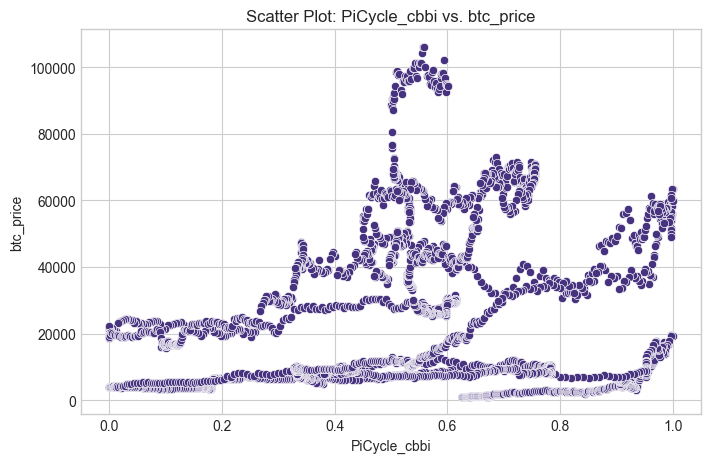

Interpretation: This scatter plot visualizes the relationship between PiCycle_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


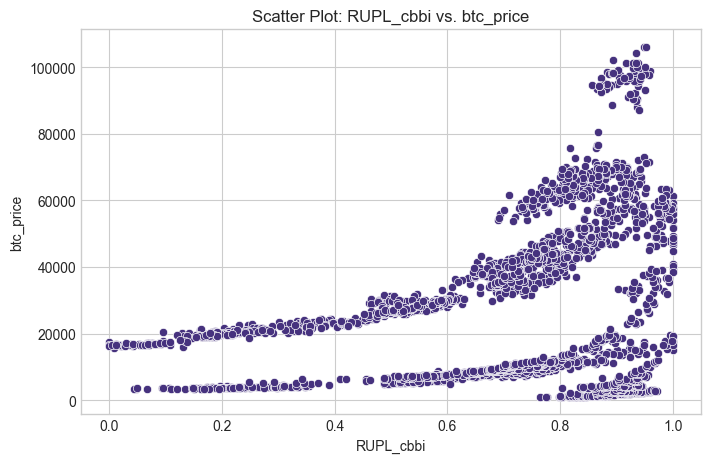

Interpretation: This scatter plot visualizes the relationship between RUPL_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


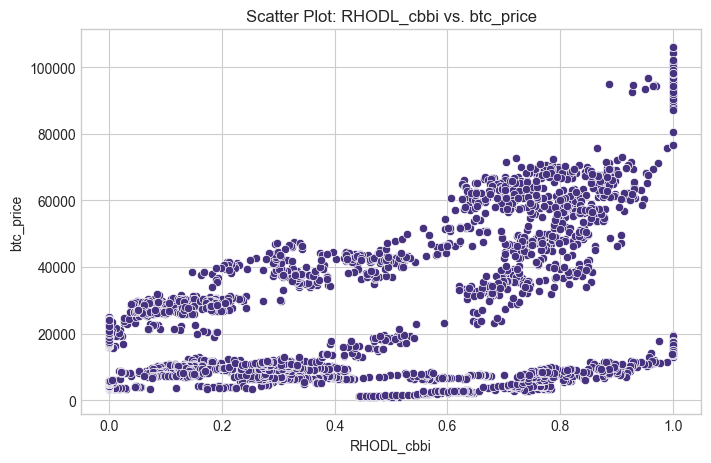

Interpretation: This scatter plot visualizes the relationship between RHODL_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


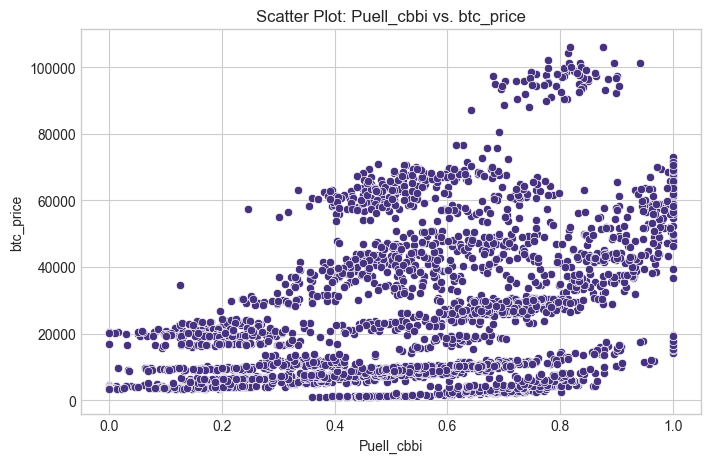

Interpretation: This scatter plot visualizes the relationship between Puell_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


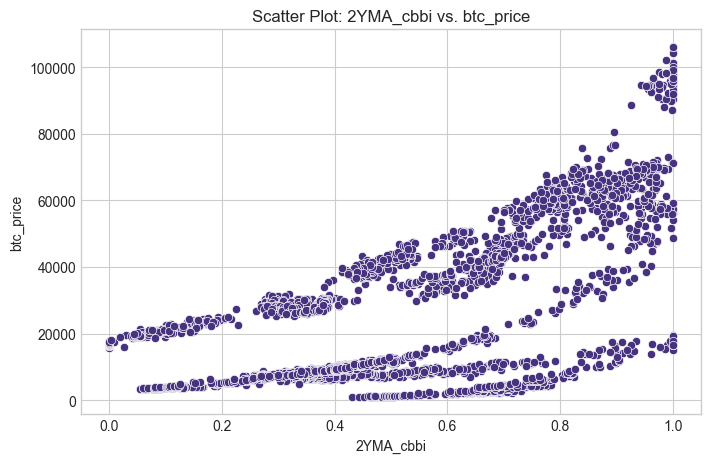

Interpretation: This scatter plot visualizes the relationship between 2YMA_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


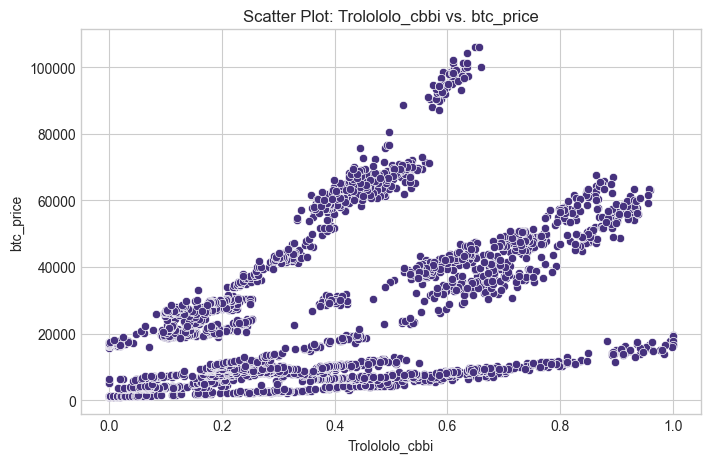

Interpretation: This scatter plot visualizes the relationship between Trolololo_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


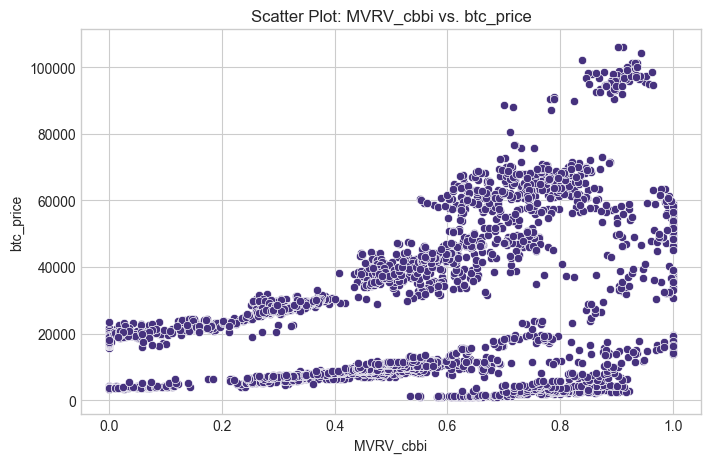

Interpretation: This scatter plot visualizes the relationship between MVRV_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


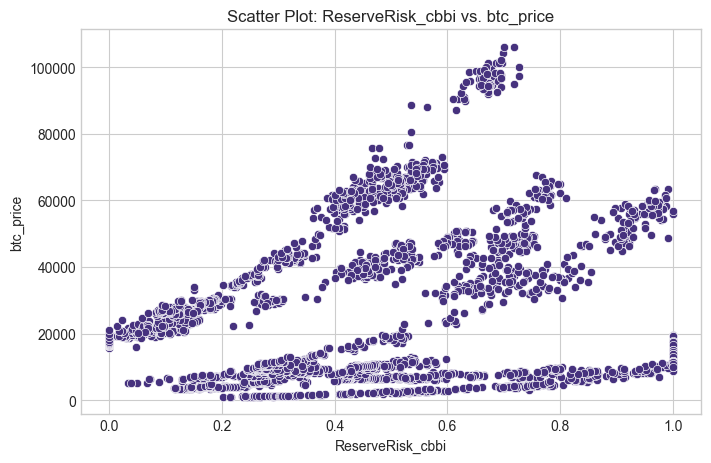

Interpretation: This scatter plot visualizes the relationship between ReserveRisk_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


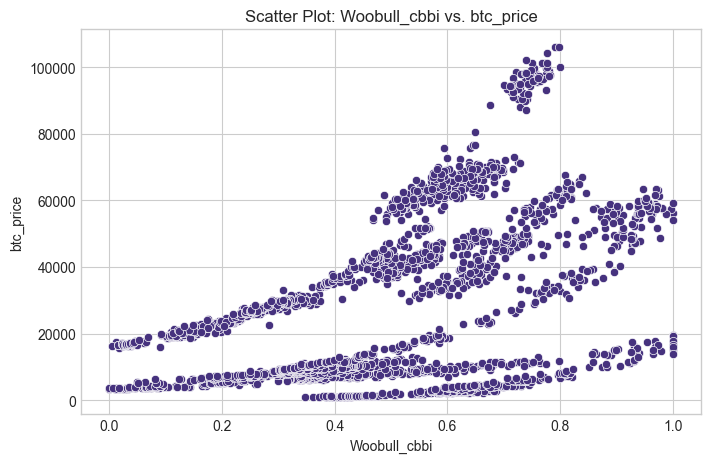

Interpretation: This scatter plot visualizes the relationship between Woobull_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


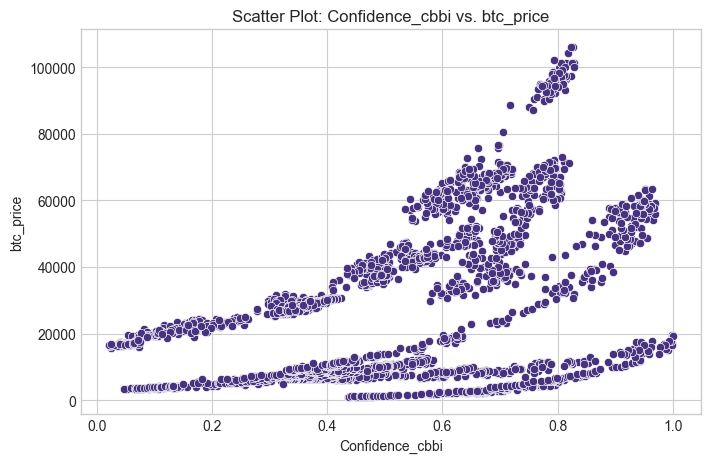

Interpretation: This scatter plot visualizes the relationship between Confidence_cbbi and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.

--- Analysis of Blockchain Features ---

Descriptive Statistics for Blockchain Features:
                                              count          mean  \
active_addresses_blockchain                  2900.0  5.965593e+05   
hash_rate_blockchain                         2900.0  2.061682e+08   
miner_revenue_blockchain                     2900.0  2.469621e+07   
difficulty_blockchain                        2900.0  2.837406e+13   
estimated_transaction_volume_usd_blockchain  2900.0  3.118685e+09   

                                                      std           min  \
active_addresses_blockchain                  1.155475e+05  3.011320e+05   
hash_rate_blockchain                         2.061533e+08  2.623277e+06   
miner_revenue_blockchain                     1.582225e+07  1.714221

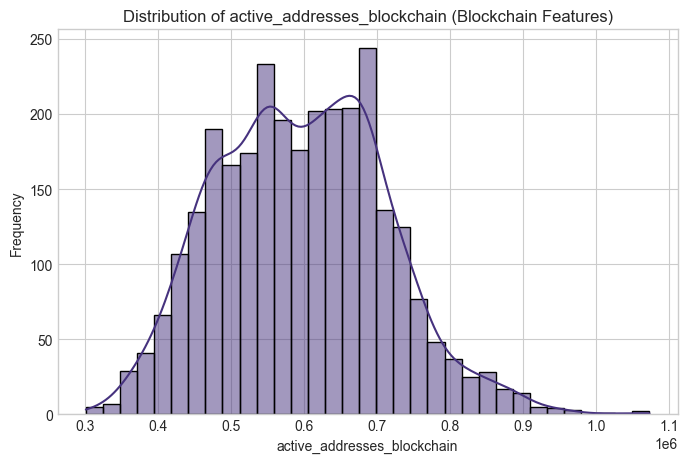

Interpretation: The histogram for active_addresses_blockchain shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


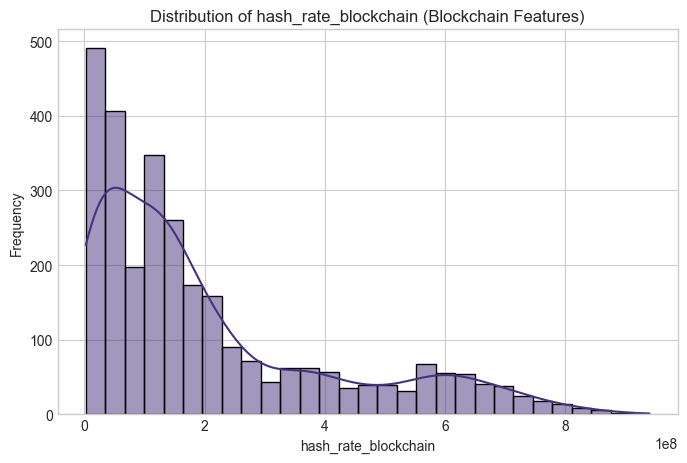

Interpretation: The histogram for hash_rate_blockchain shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


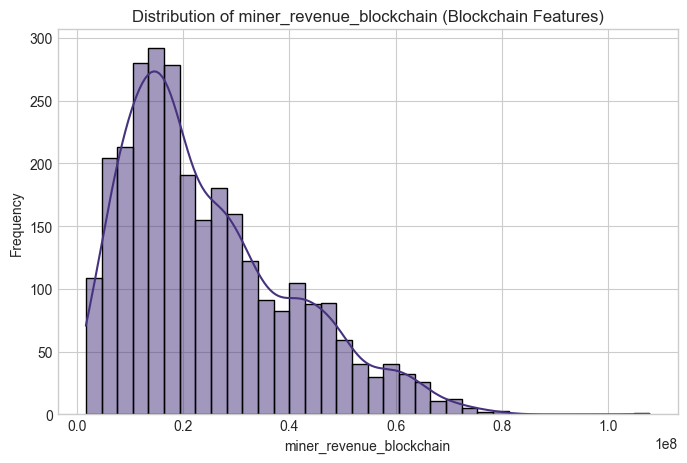

Interpretation: The histogram for miner_revenue_blockchain shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


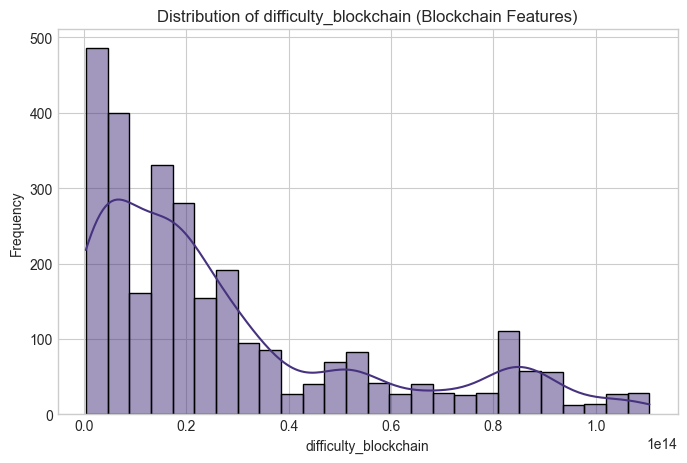

Interpretation: The histogram for difficulty_blockchain shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


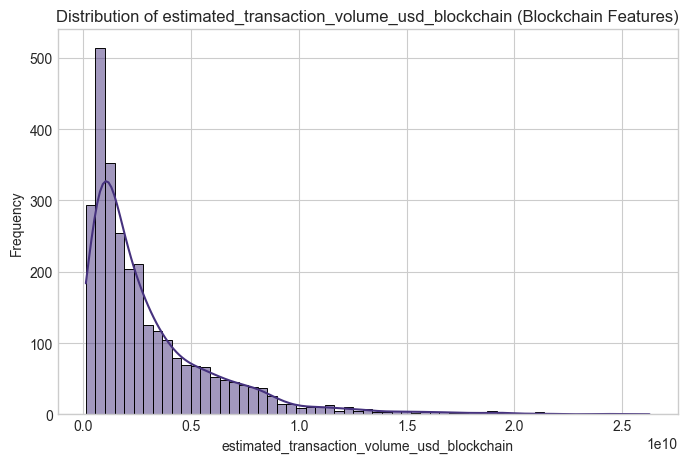

Interpretation: The histogram for estimated_transaction_volume_usd_blockchain shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.

Correlation Analysis for Blockchain Features:


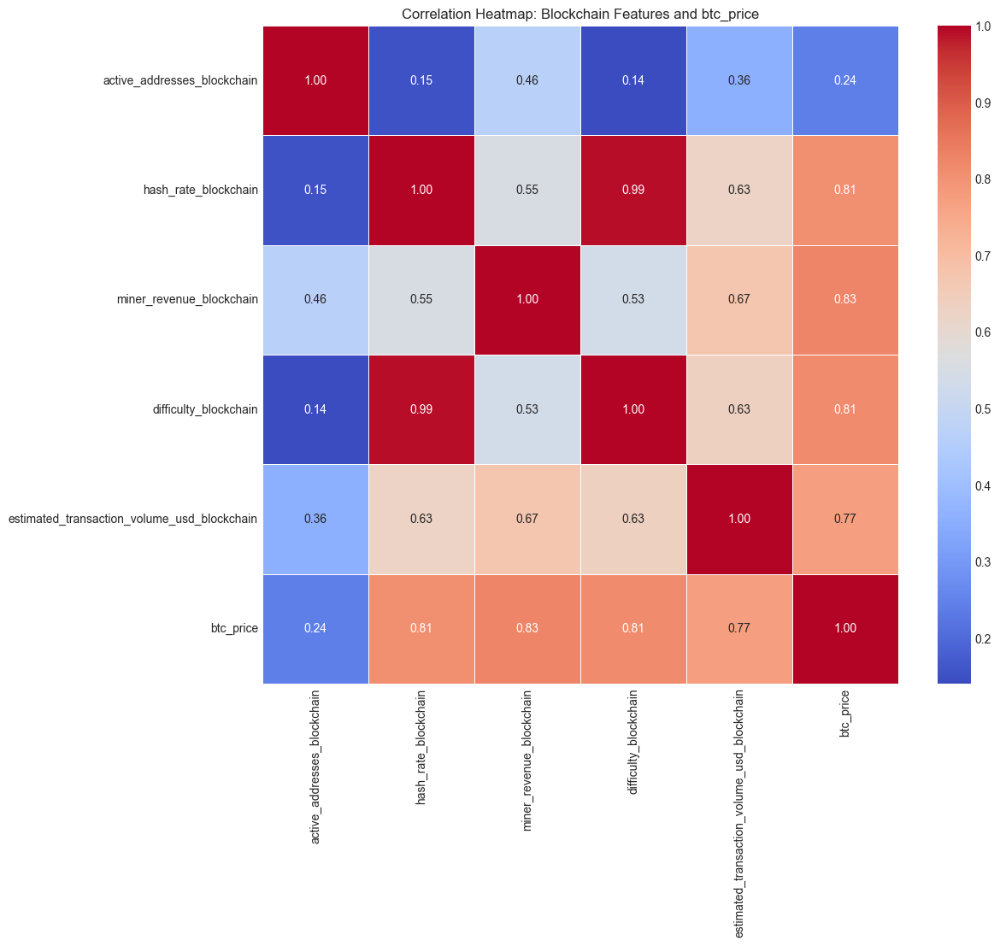

Interpretation: The heatmap shows linear correlations. Values close to +1 or -1 indicate strong positive or negative linear relationships, respectively. Values close to 0 suggest weak linear relationships. Pay attention to correlations between features (multicollinearity) and between features and 'btc_price'.

Scatter Plots for Blockchain Features vs. btc_price:


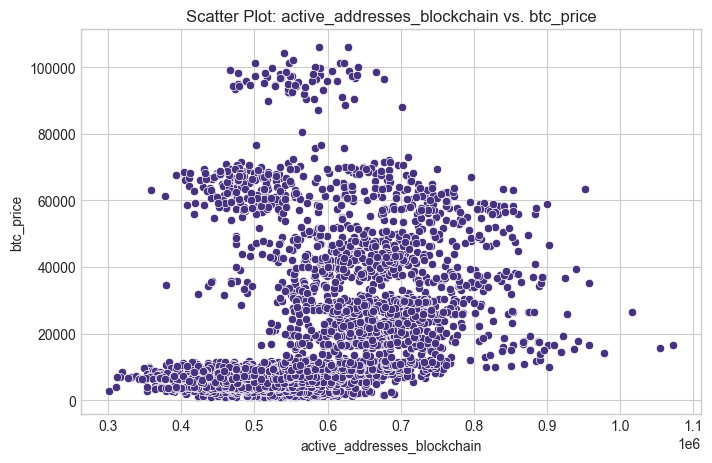

Interpretation: This scatter plot visualizes the relationship between active_addresses_blockchain and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


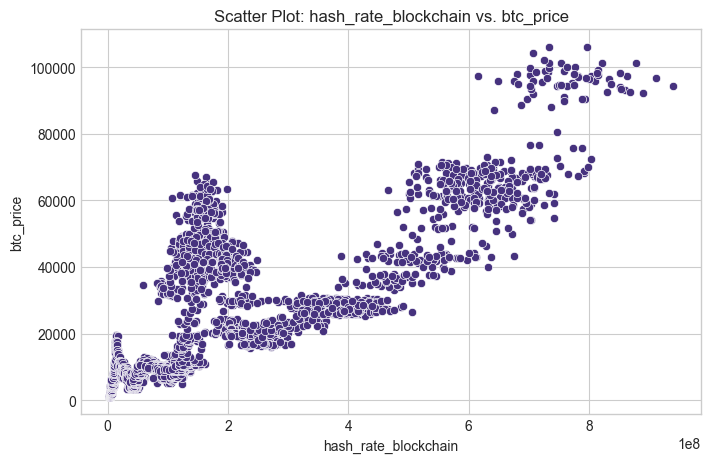

Interpretation: This scatter plot visualizes the relationship between hash_rate_blockchain and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


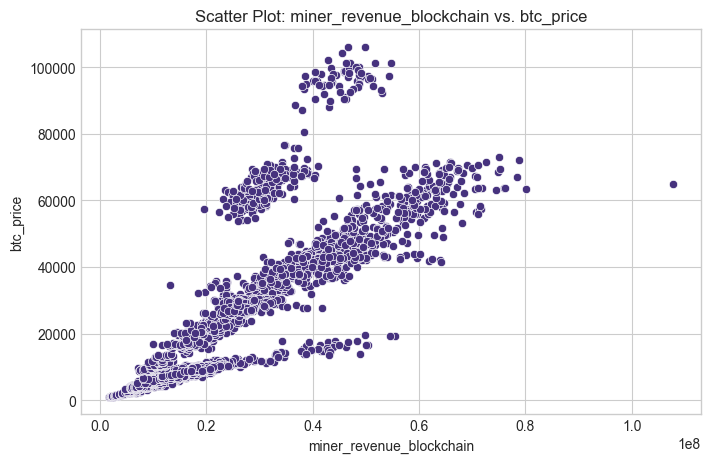

Interpretation: This scatter plot visualizes the relationship between miner_revenue_blockchain and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


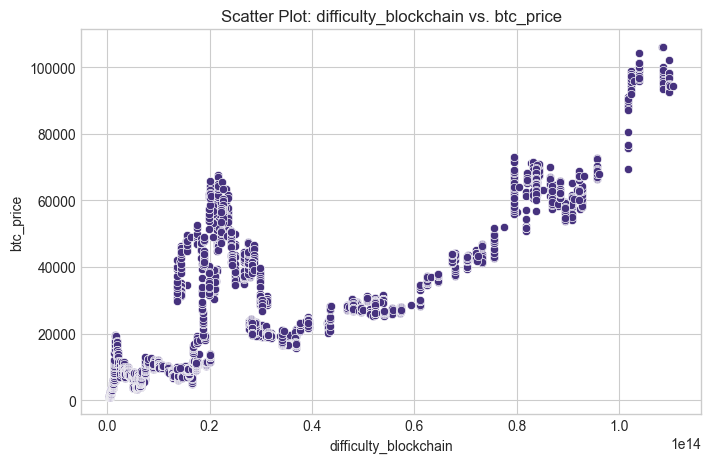

Interpretation: This scatter plot visualizes the relationship between difficulty_blockchain and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


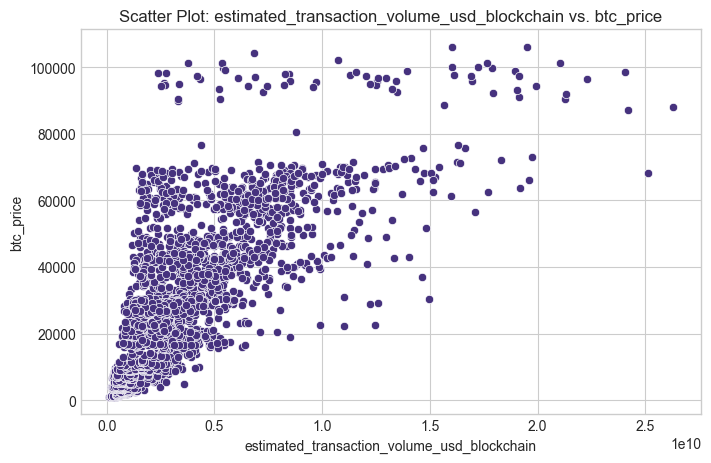

Interpretation: This scatter plot visualizes the relationship between estimated_transaction_volume_usd_blockchain and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.

--- Analysis of Cross Market Features ---

Descriptive Statistics for Cross Market Features:
                  count          mean          std           min  \
Gold_Price       2900.0   1713.240240   378.935502   1176.199951   
Gold_Share       2900.0    160.414124    34.076342    111.099998   
Gold_Volatility  2900.0     15.461207     4.298646      8.880000   
Oil_Crude_Price  2900.0     66.201541    17.815086    -37.630001   
Oil_Brent_Price  2900.0     70.937441    17.773546     19.330000   
Oil_Volatility   2900.0     39.290486    19.894647     17.860001   
DJI              2900.0  30366.452110  5941.664976  18591.929688   
GSPC             2900.0   3703.194598   980.560991   2237.399902   
IXIC             2900.0  11180.898689  3709.805234   5663.54980

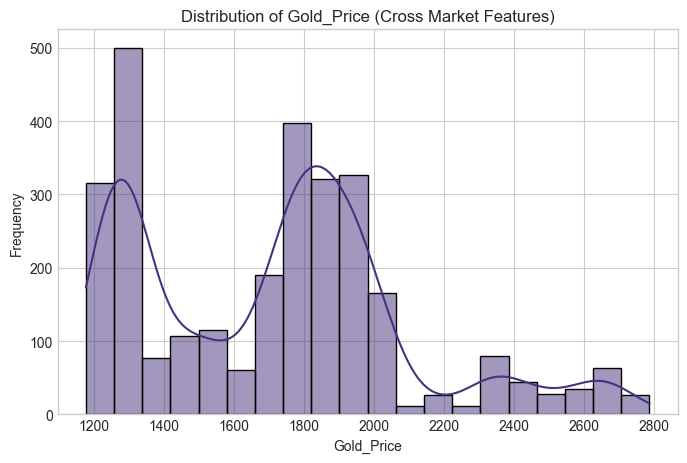

Interpretation: The histogram for Gold_Price shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


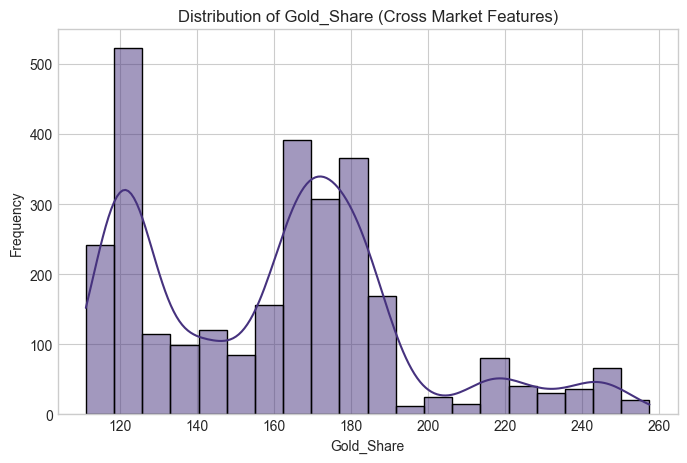

Interpretation: The histogram for Gold_Share shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


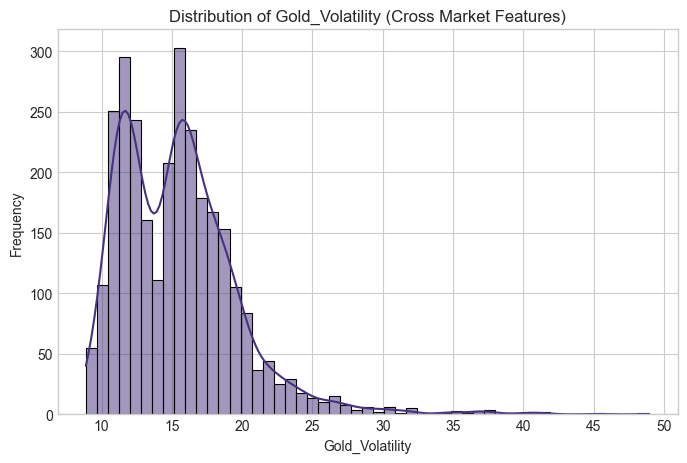

Interpretation: The histogram for Gold_Volatility shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


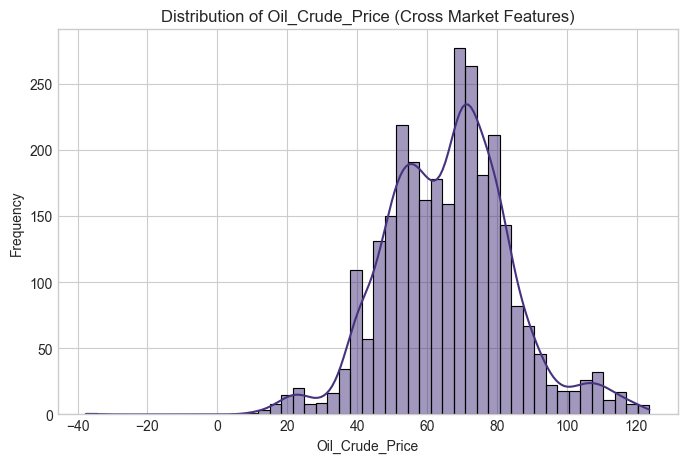

Interpretation: The histogram for Oil_Crude_Price shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


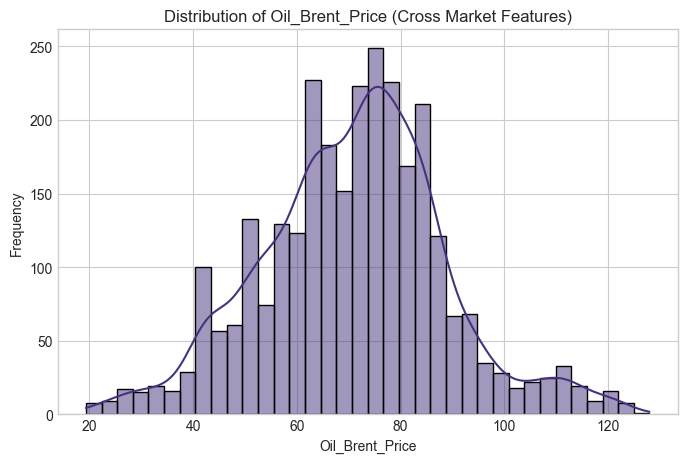

Interpretation: The histogram for Oil_Brent_Price shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


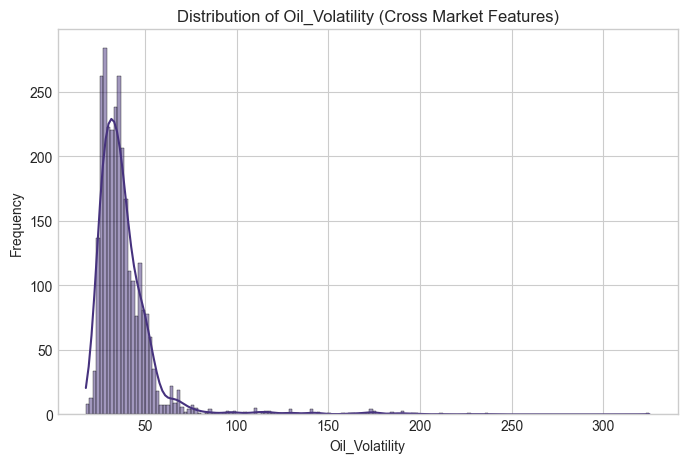

Interpretation: The histogram for Oil_Volatility shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


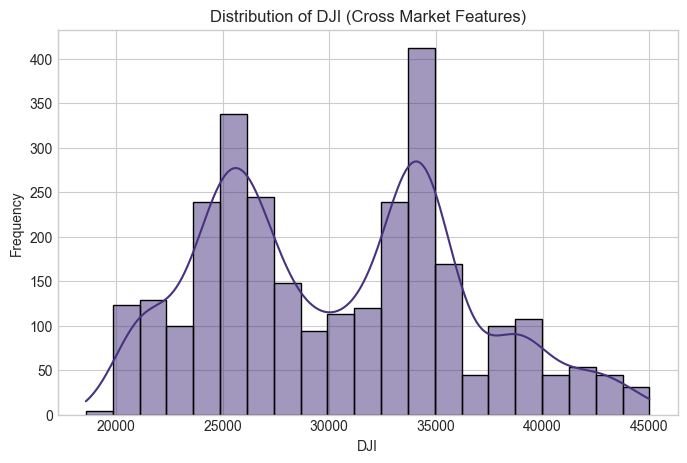

Interpretation: The histogram for DJI shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


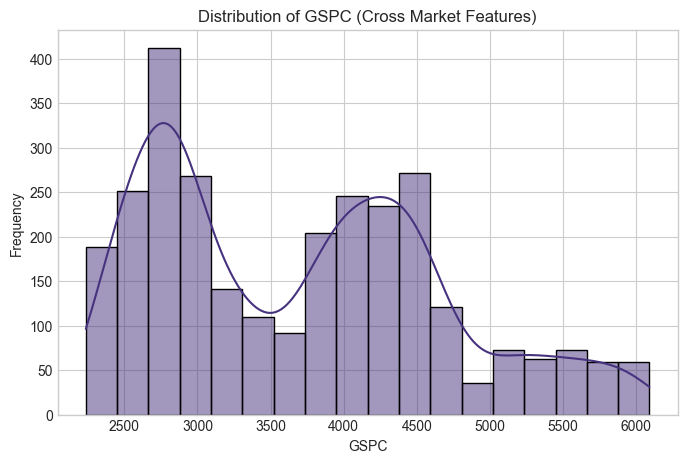

Interpretation: The histogram for GSPC shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


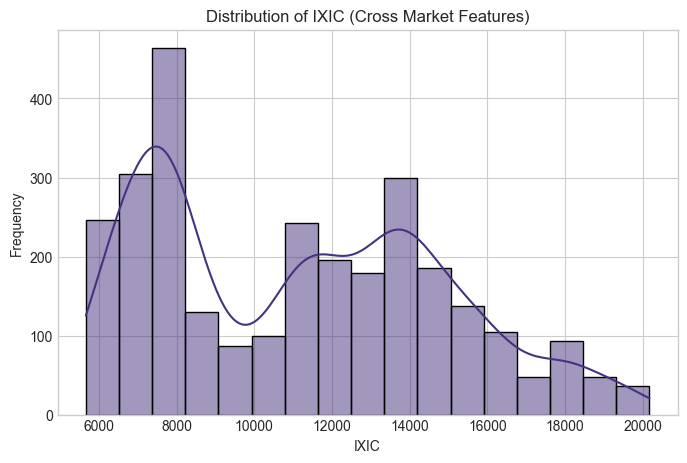

Interpretation: The histogram for IXIC shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


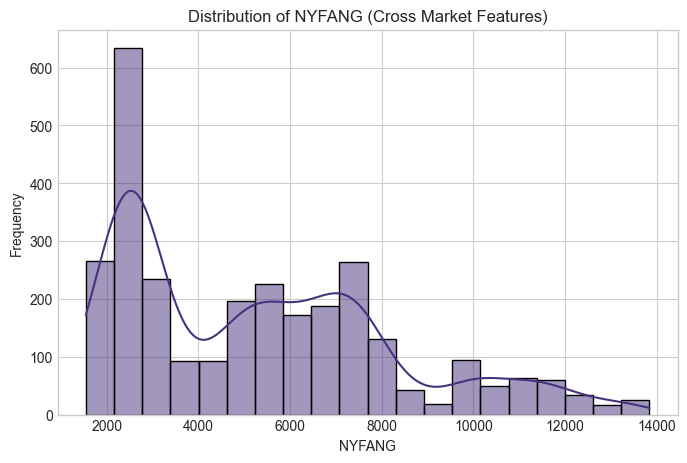

Interpretation: The histogram for NYFANG shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


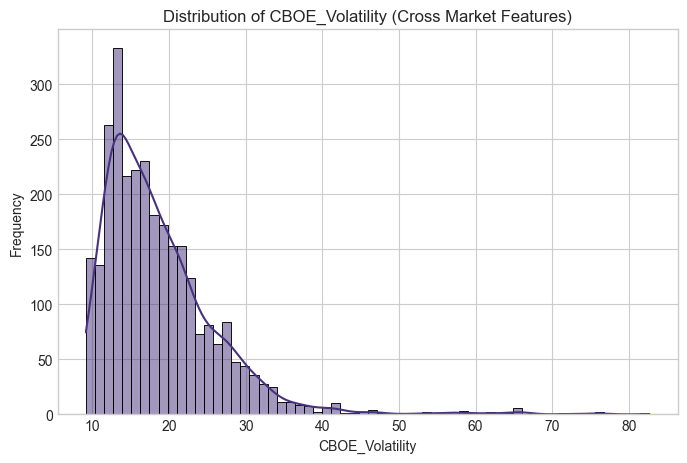

Interpretation: The histogram for CBOE_Volatility shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


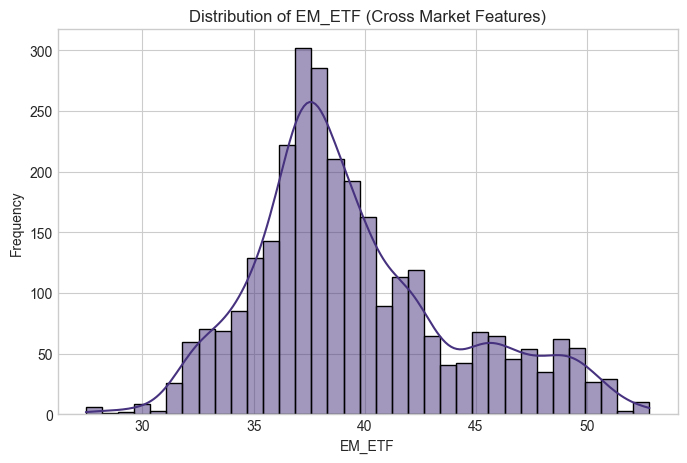

Interpretation: The histogram for EM_ETF shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


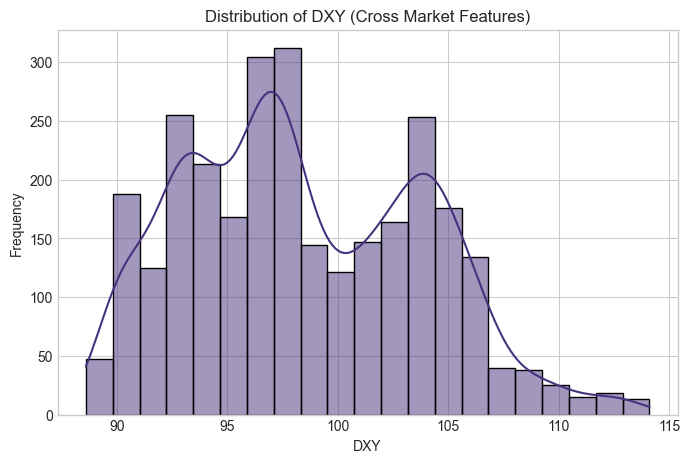

Interpretation: The histogram for DXY shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


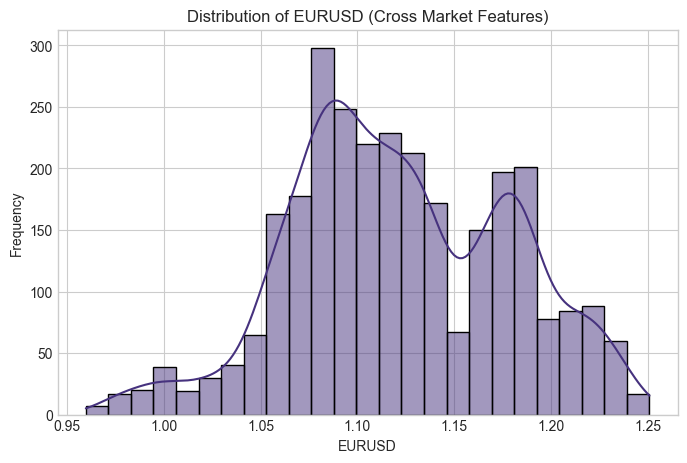

Interpretation: The histogram for EURUSD shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.

Correlation Analysis for Cross Market Features:


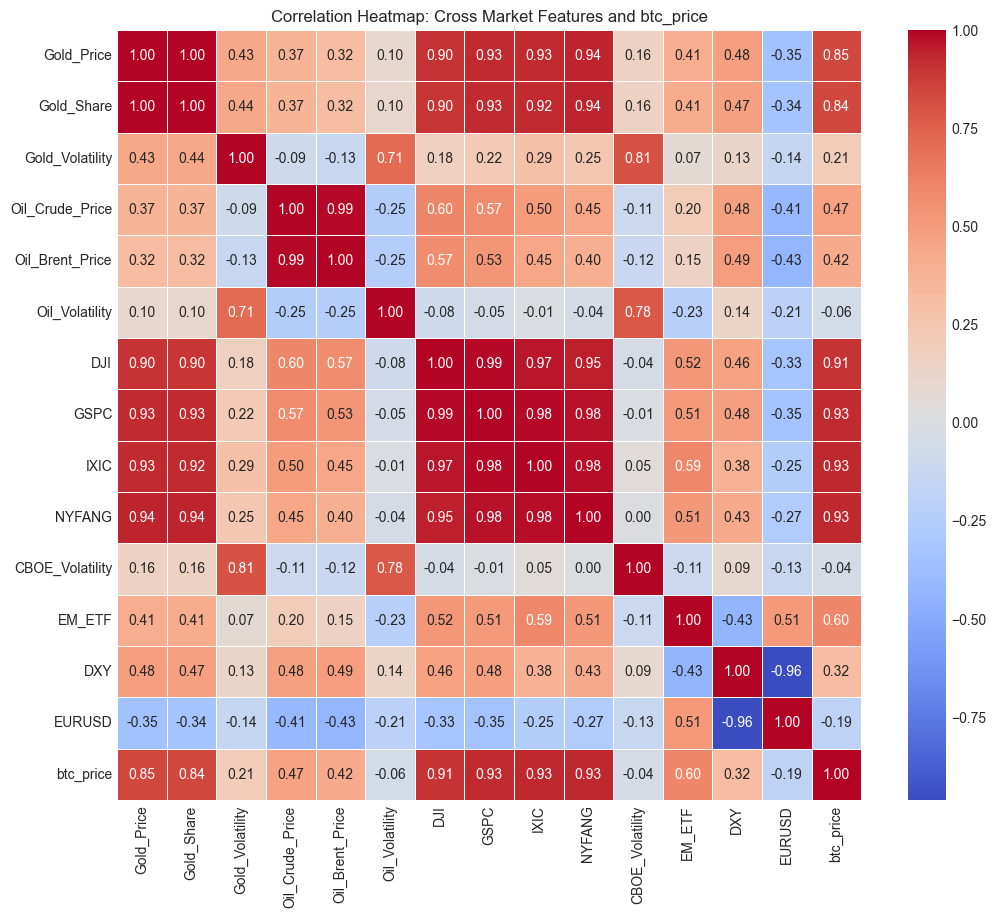

Interpretation: The heatmap shows linear correlations. Values close to +1 or -1 indicate strong positive or negative linear relationships, respectively. Values close to 0 suggest weak linear relationships. Pay attention to correlations between features (multicollinearity) and between features and 'btc_price'.

Scatter Plots for Cross Market Features vs. btc_price:


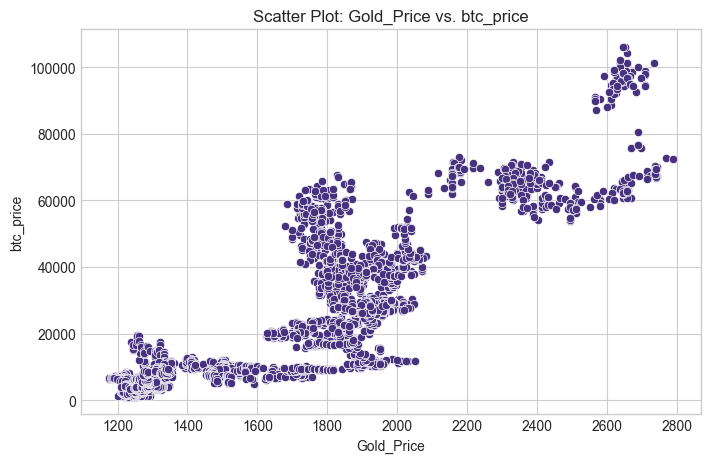

Interpretation: This scatter plot visualizes the relationship between Gold_Price and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


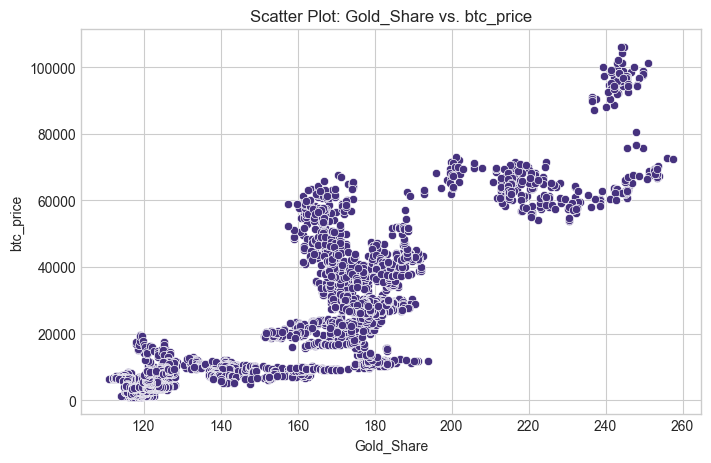

Interpretation: This scatter plot visualizes the relationship between Gold_Share and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


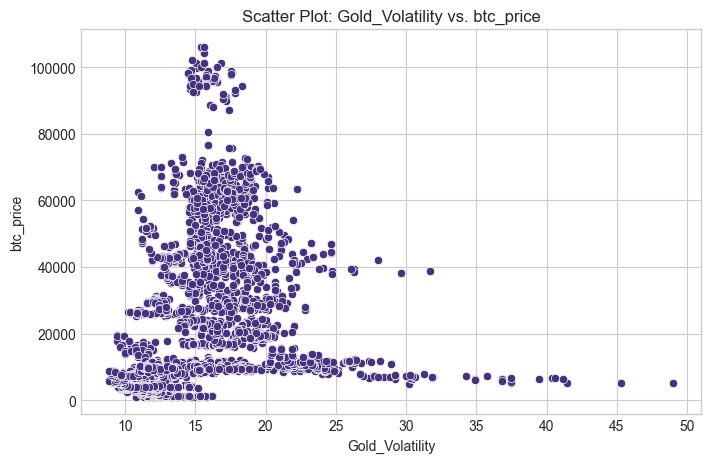

Interpretation: This scatter plot visualizes the relationship between Gold_Volatility and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


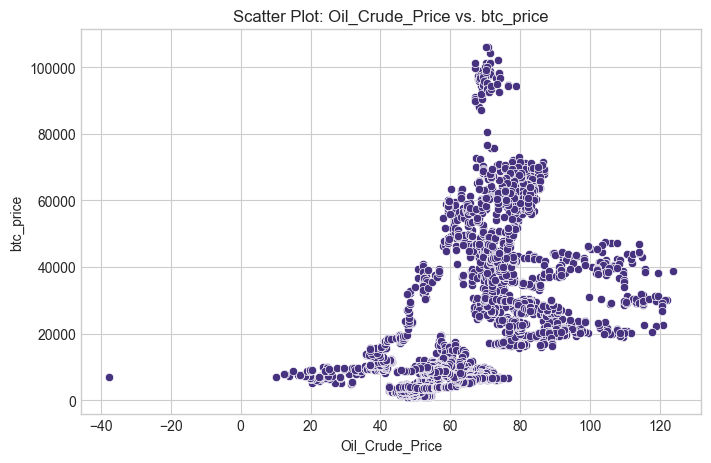

Interpretation: This scatter plot visualizes the relationship between Oil_Crude_Price and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


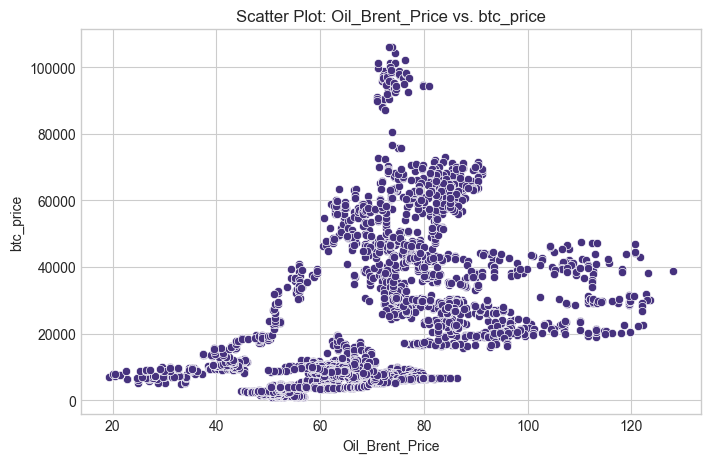

Interpretation: This scatter plot visualizes the relationship between Oil_Brent_Price and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


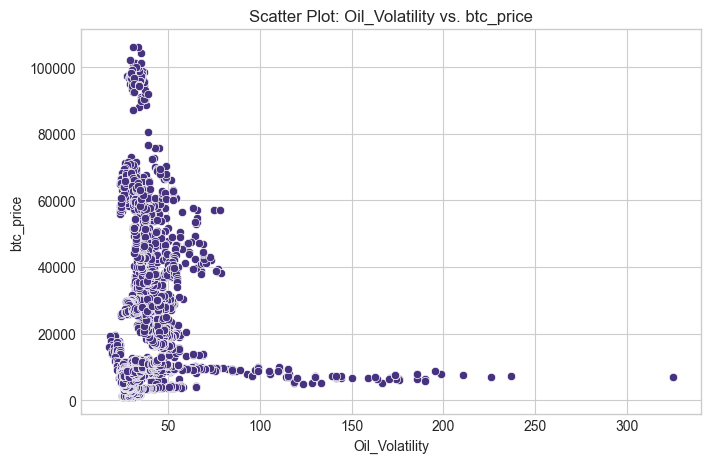

Interpretation: This scatter plot visualizes the relationship between Oil_Volatility and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


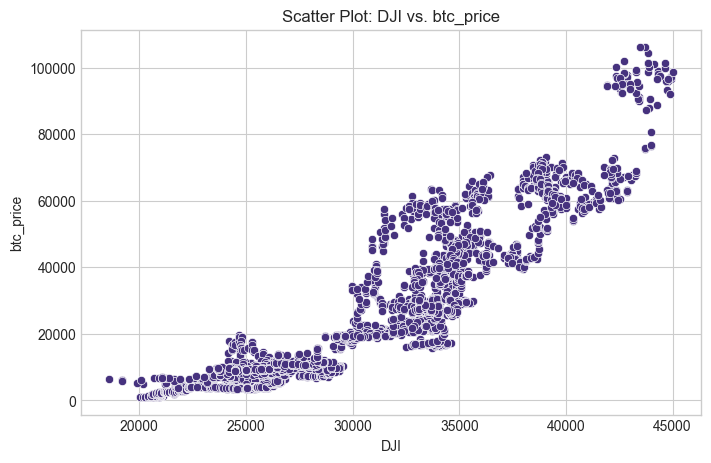

Interpretation: This scatter plot visualizes the relationship between DJI and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


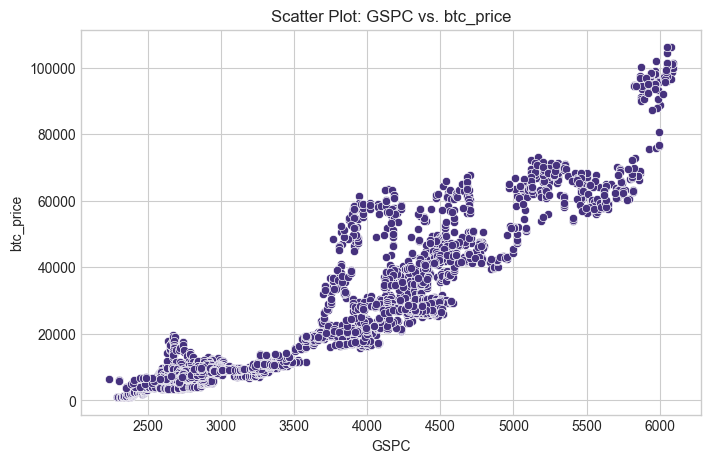

Interpretation: This scatter plot visualizes the relationship between GSPC and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


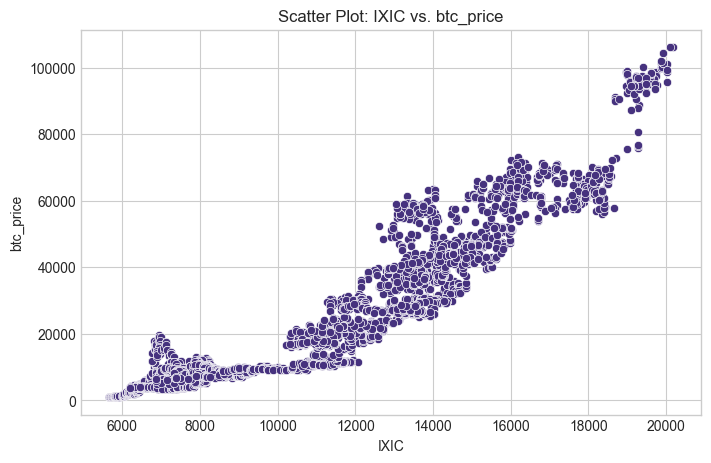

Interpretation: This scatter plot visualizes the relationship between IXIC and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


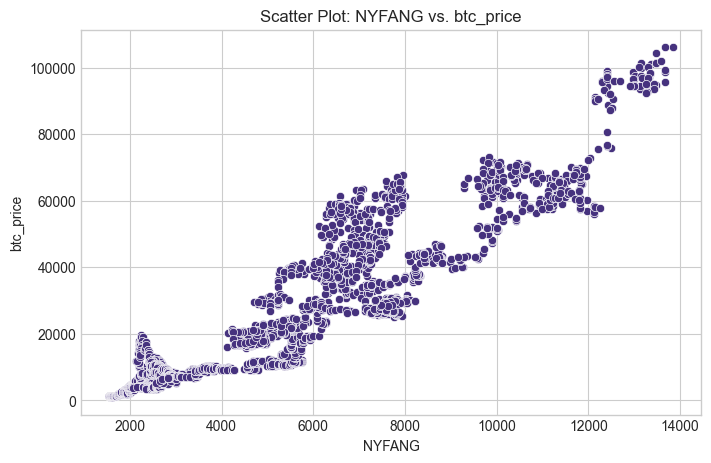

Interpretation: This scatter plot visualizes the relationship between NYFANG and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


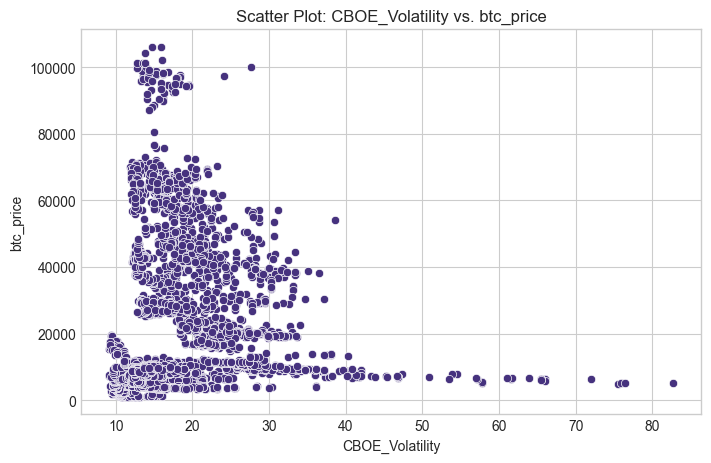

Interpretation: This scatter plot visualizes the relationship between CBOE_Volatility and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


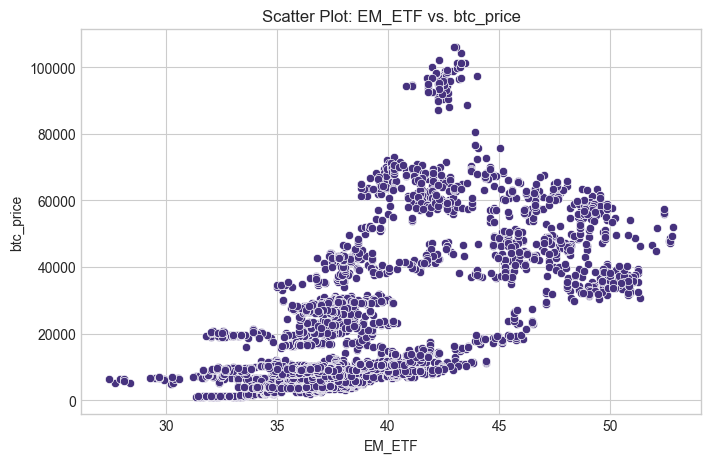

Interpretation: This scatter plot visualizes the relationship between EM_ETF and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


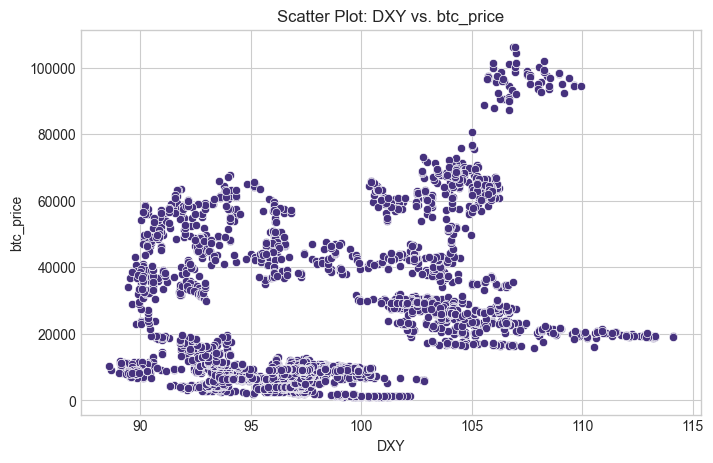

Interpretation: This scatter plot visualizes the relationship between DXY and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


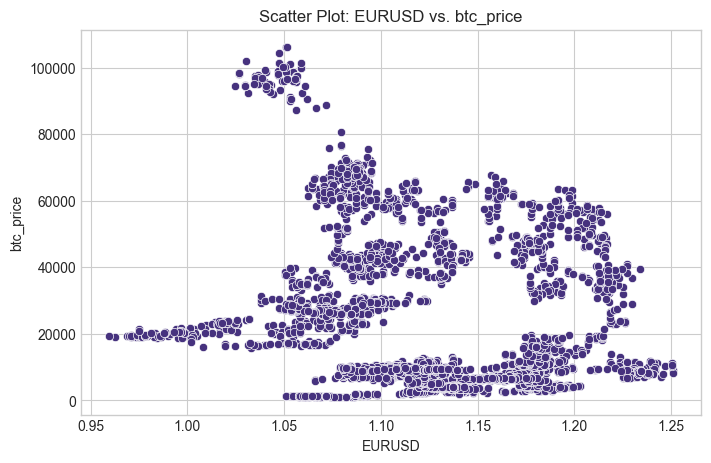

Interpretation: This scatter plot visualizes the relationship between EURUSD and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.

--- Analysis of Technical Indicator Features ---

Descriptive Statistics for Technical Indicator Features:
                       count          mean           std           min  \
btc_sma_14            2900.0  2.547599e+04  2.238497e+04  9.561015e+02   
btc_ema_14            2900.0  2.547595e+04  2.235154e+04  9.715592e+02   
btc_rsi_14            2900.0  5.336309e+01  1.424006e+01  9.920239e+00   
btc_macd              2900.0  2.306594e+02  1.301806e+03 -5.053274e+03   
btc_macd_signal       2900.0  2.310462e+02  1.239659e+03 -4.438999e+03   
btc_macd_diff         2900.0 -3.868605e-01  3.551473e+02 -1.694518e+03   
btc_bb_high           2900.0  2.813282e+04  2.440968e+04  1.040061e+03   
btc_bb_low            2900.0  2.262302e+04  2.027186e+04  8.412087e+02   
btc_bb_mid            2900.0  2.

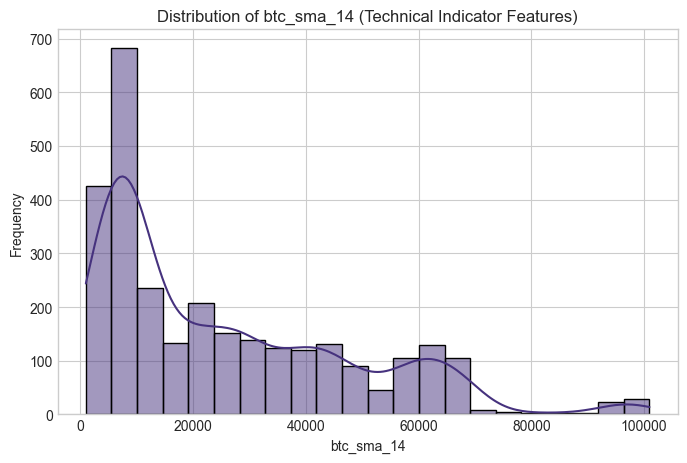

Interpretation: The histogram for btc_sma_14 shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


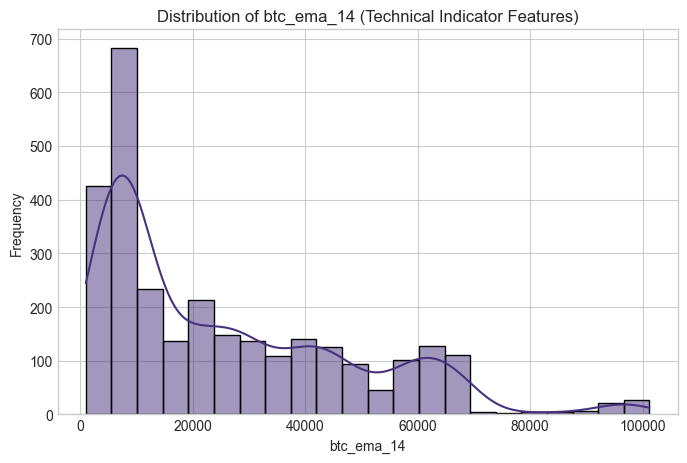

Interpretation: The histogram for btc_ema_14 shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


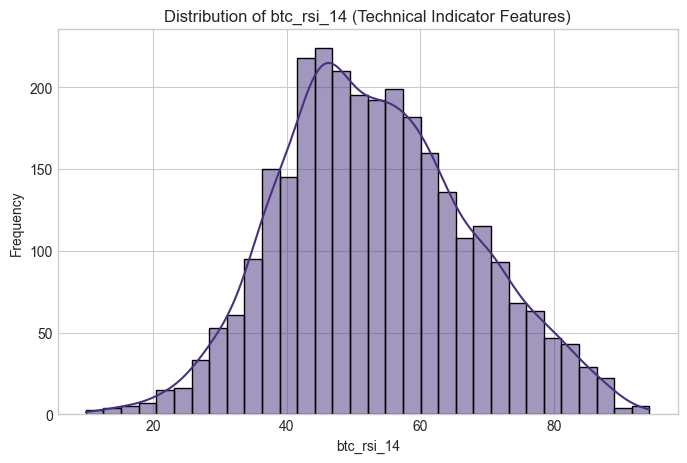

Interpretation: The histogram for btc_rsi_14 shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


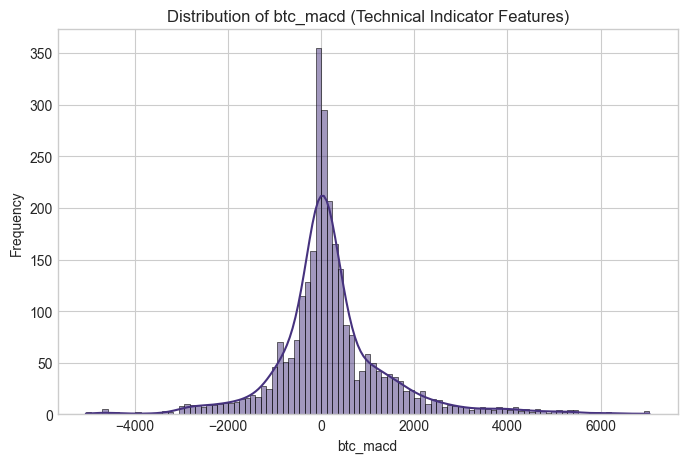

Interpretation: The histogram for btc_macd shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


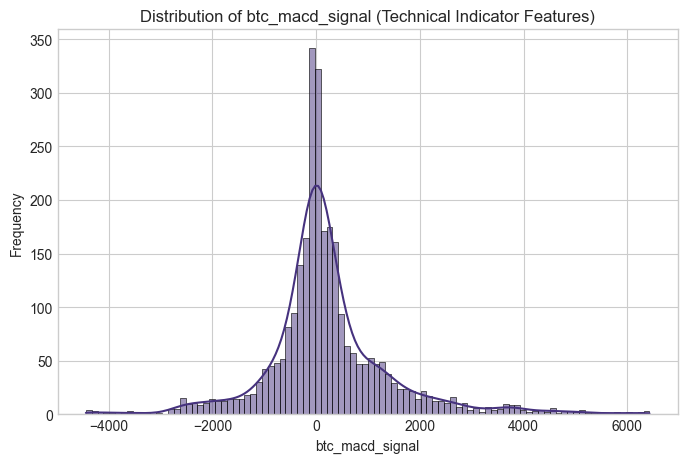

Interpretation: The histogram for btc_macd_signal shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


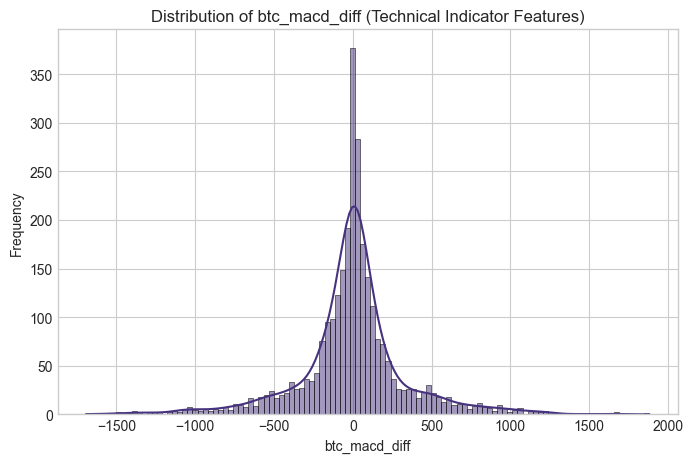

Interpretation: The histogram for btc_macd_diff shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


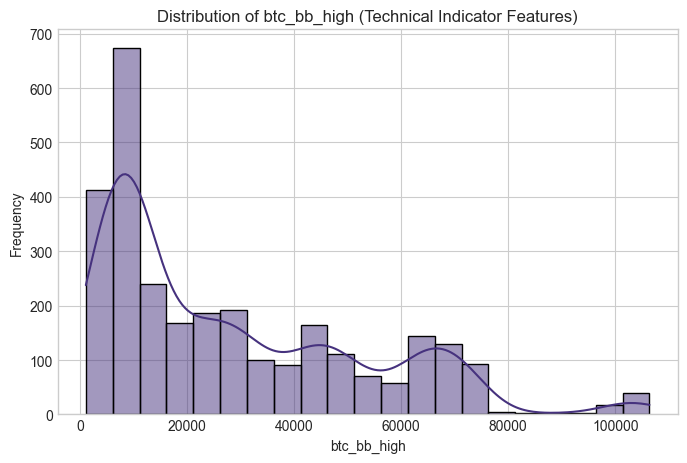

Interpretation: The histogram for btc_bb_high shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


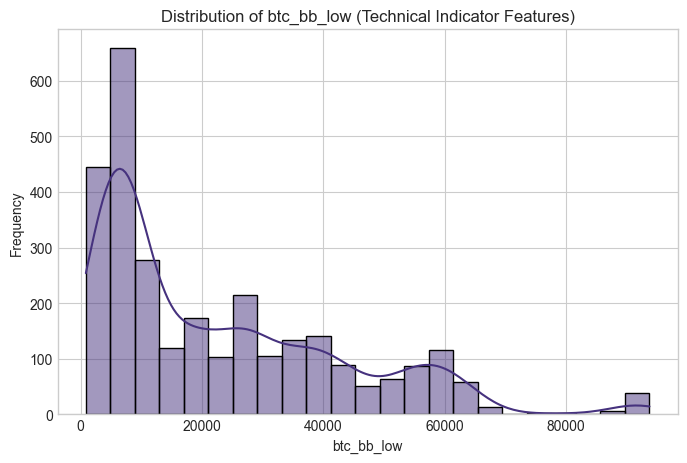

Interpretation: The histogram for btc_bb_low shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


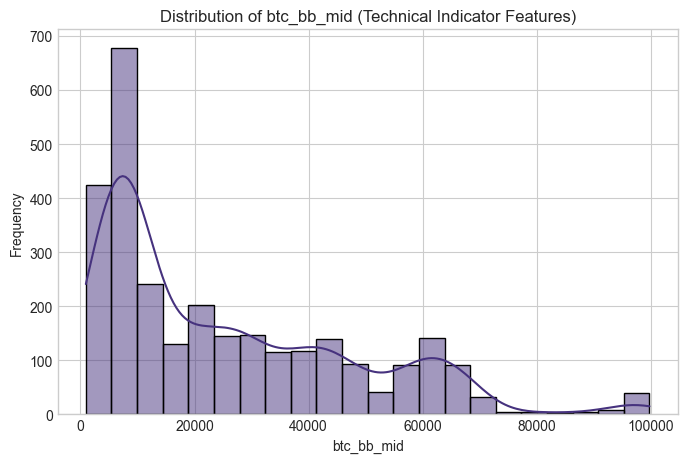

Interpretation: The histogram for btc_bb_mid shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


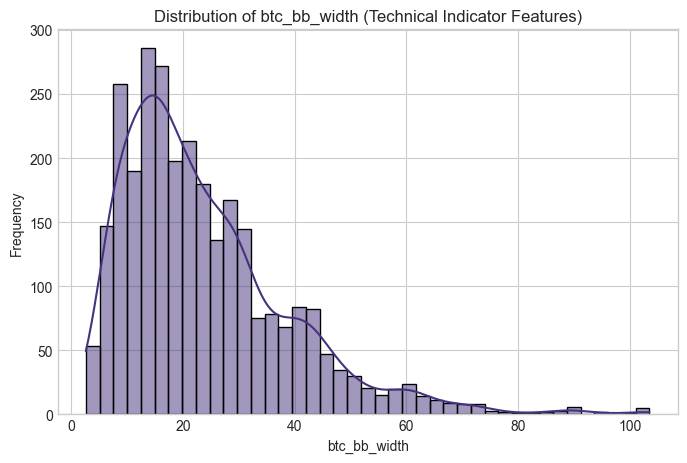

Interpretation: The histogram for btc_bb_width shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


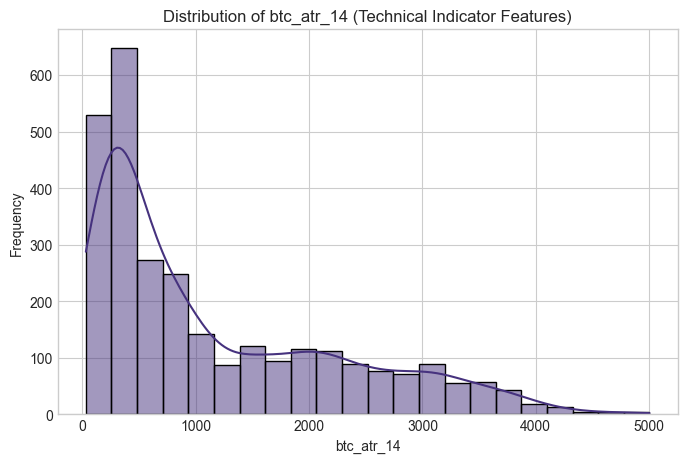

Interpretation: The histogram for btc_atr_14 shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


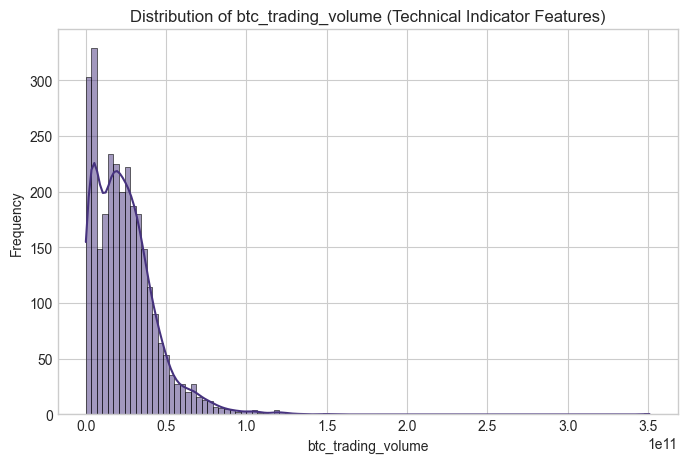

Interpretation: The histogram for btc_trading_volume shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.


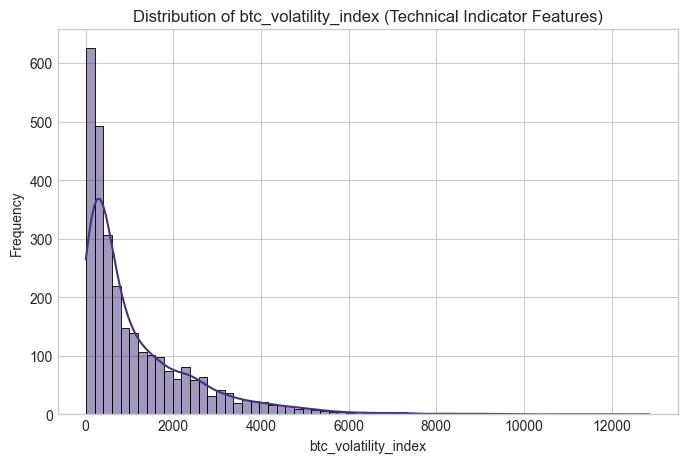

Interpretation: The histogram for btc_volatility_index shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.

Correlation Analysis for Technical Indicator Features:


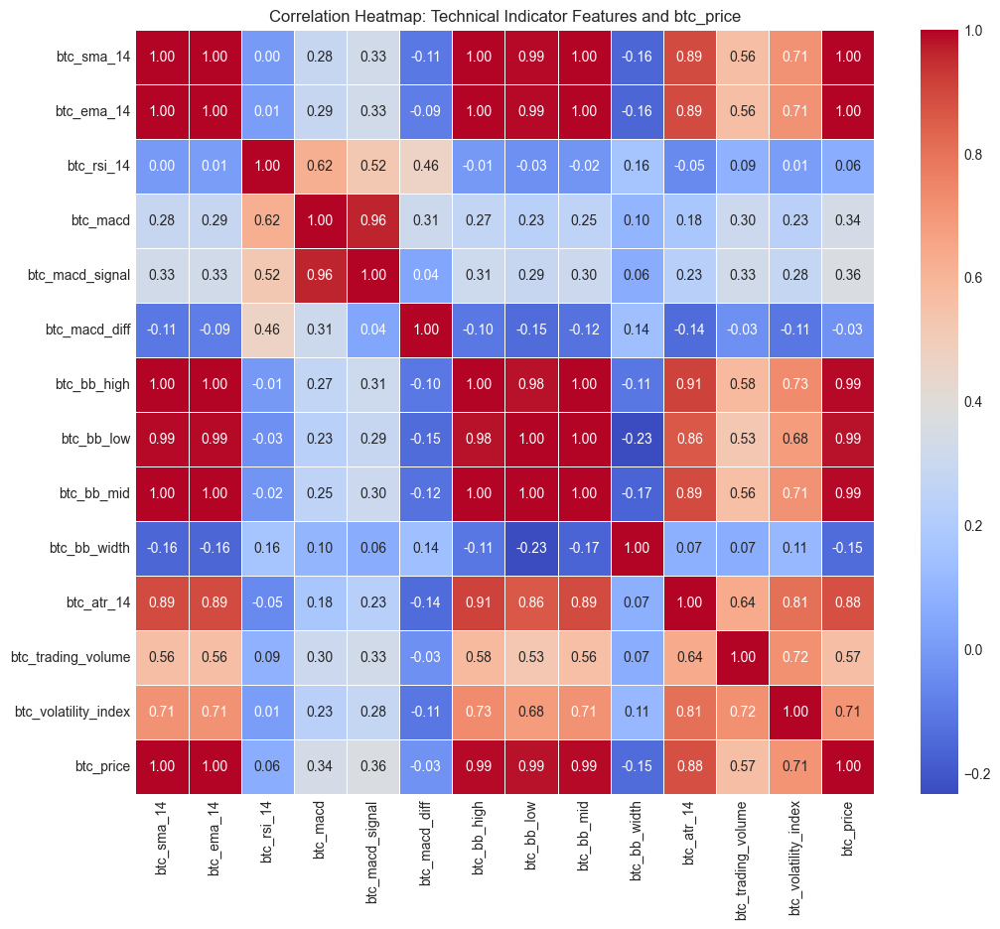

Interpretation: The heatmap shows linear correlations. Values close to +1 or -1 indicate strong positive or negative linear relationships, respectively. Values close to 0 suggest weak linear relationships. Pay attention to correlations between features (multicollinearity) and between features and 'btc_price'.

Scatter Plots for Technical Indicator Features vs. btc_price:


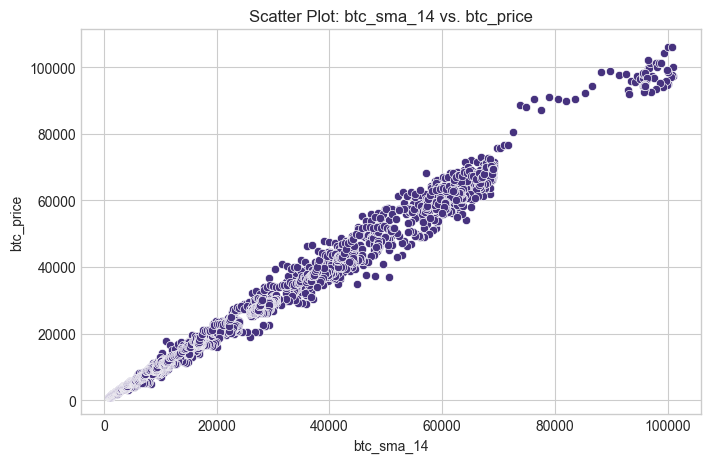

Interpretation: This scatter plot visualizes the relationship between btc_sma_14 and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


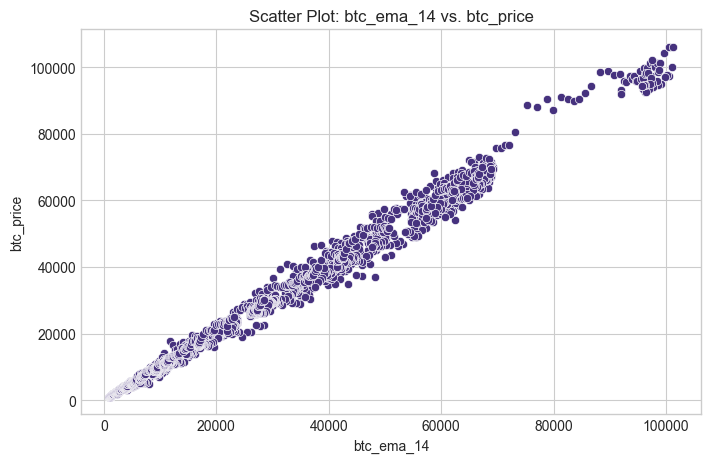

Interpretation: This scatter plot visualizes the relationship between btc_ema_14 and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


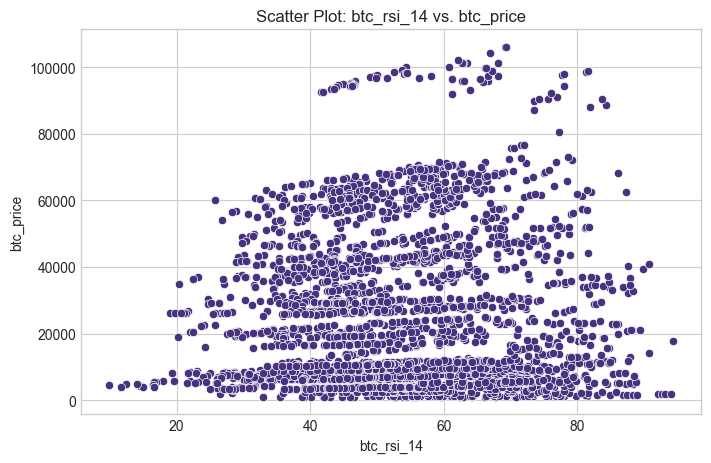

Interpretation: This scatter plot visualizes the relationship between btc_rsi_14 and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


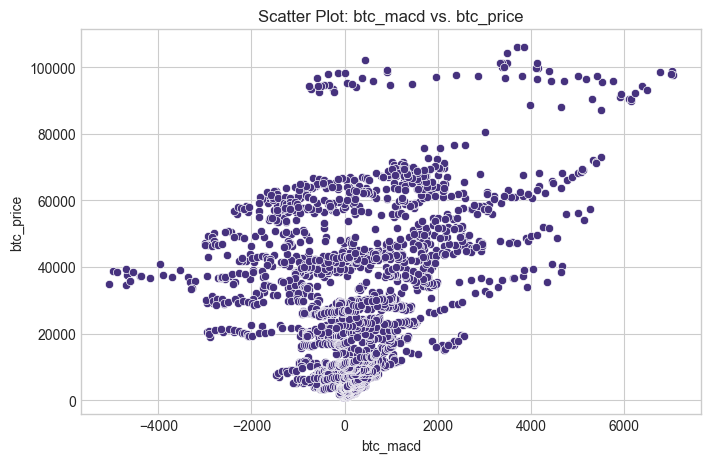

Interpretation: This scatter plot visualizes the relationship between btc_macd and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


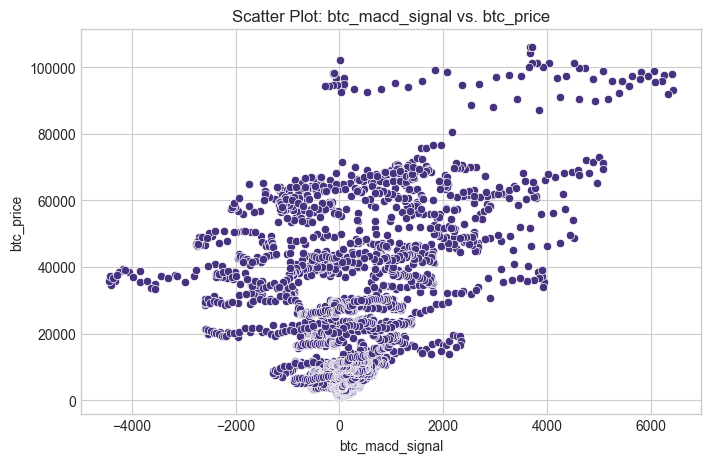

Interpretation: This scatter plot visualizes the relationship between btc_macd_signal and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


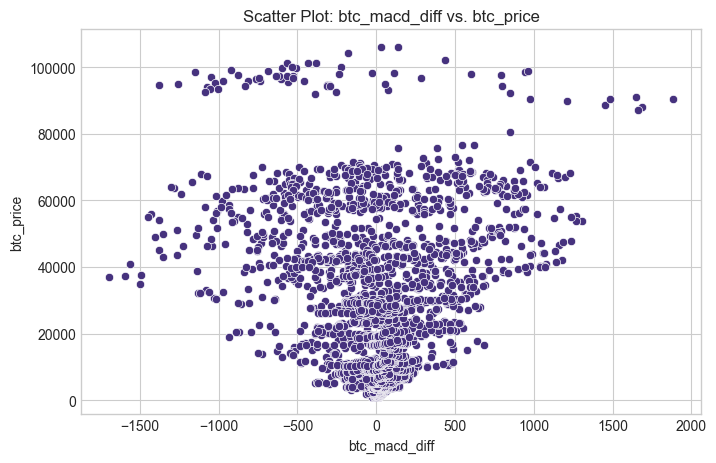

Interpretation: This scatter plot visualizes the relationship between btc_macd_diff and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


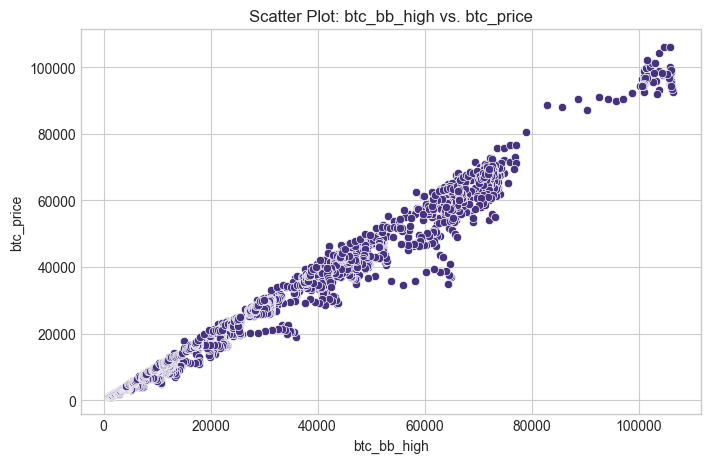

Interpretation: This scatter plot visualizes the relationship between btc_bb_high and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


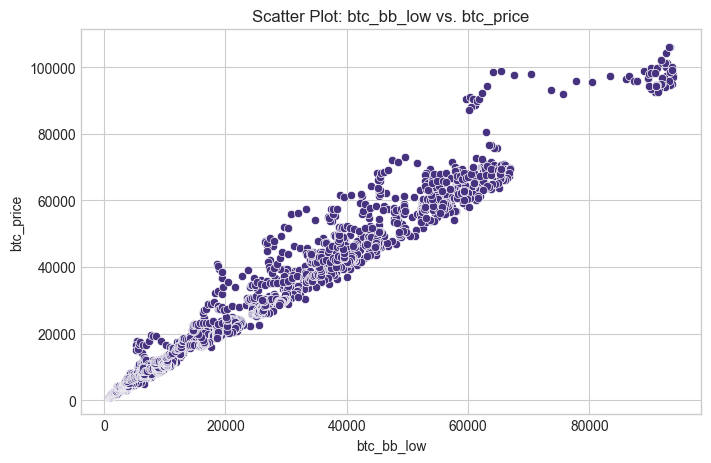

Interpretation: This scatter plot visualizes the relationship between btc_bb_low and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


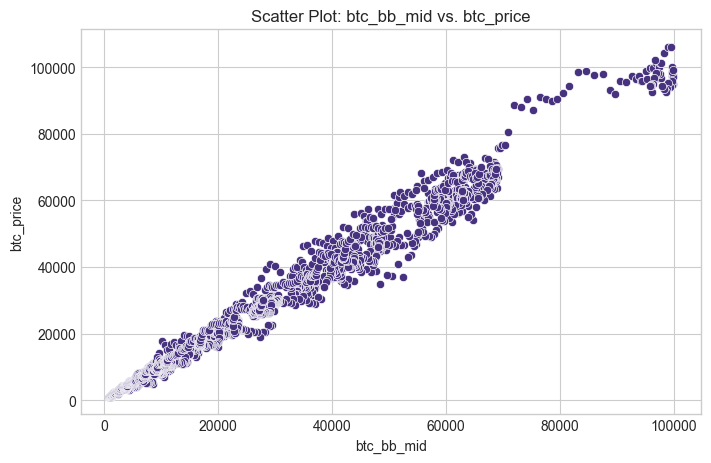

Interpretation: This scatter plot visualizes the relationship between btc_bb_mid and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


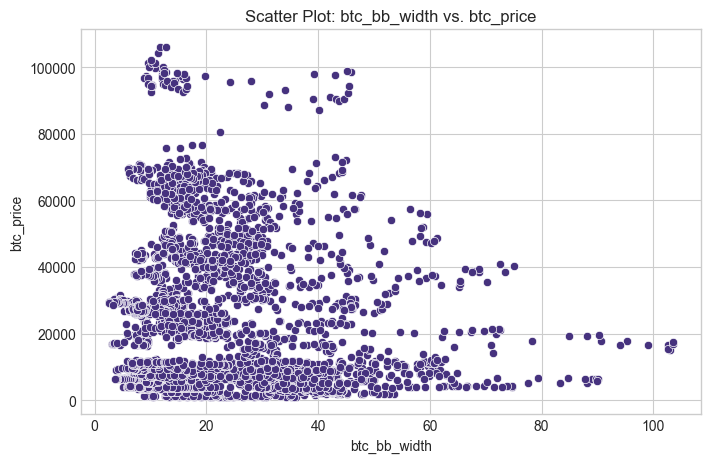

Interpretation: This scatter plot visualizes the relationship between btc_bb_width and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


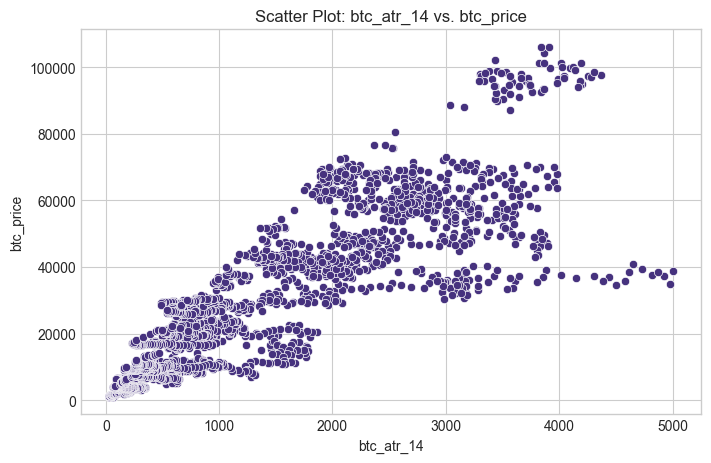

Interpretation: This scatter plot visualizes the relationship between btc_atr_14 and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


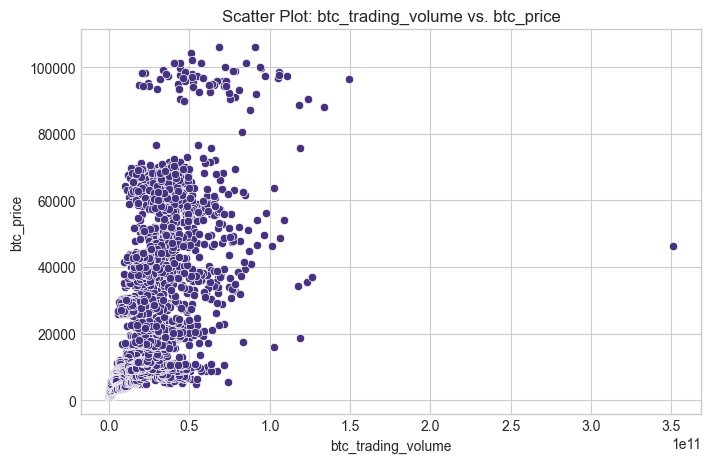

Interpretation: This scatter plot visualizes the relationship between btc_trading_volume and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.


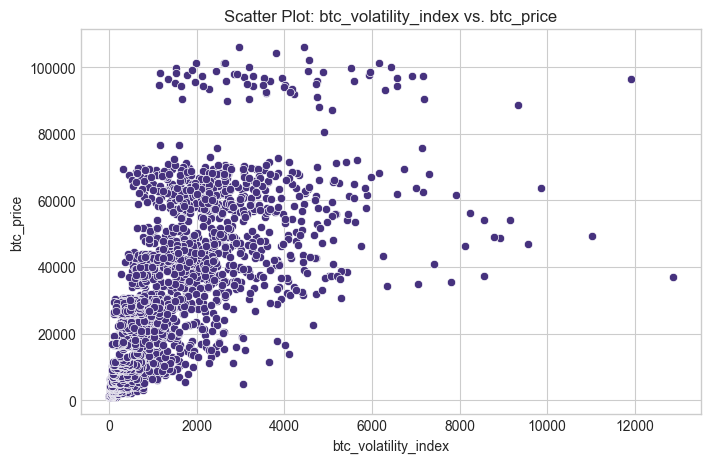

Interpretation: This scatter plot visualizes the relationship between btc_volatility_index and btc_price. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.

Skipping Sentiment Features due to missing features or target variable.
Features missing from Sentiment Features: ['CSCSI20']


In [84]:
# Analyze All Features
def analyze_feature_group(df, features_in_group, group_name, target_col):
    """Performs and visualizes analysis for a specific group of features."""
    print(f"\n--- Analysis of {group_name} ---")

    if not all(feature in df.columns for feature in features_in_group):
        print(f"Warning: Not all features from {group_name} are present in the DataFrame. Skipping analysis for this group.")
        # Identify missing features
        missing_features = [f for f in features_in_group if f not in df.columns]
        print(f"Missing features: {missing_features}")
        return

    # 1. Descriptive Statistics for the group
    print(f"\nDescriptive Statistics for {group_name}:")
    print(df[features_in_group].describe().T)
    print("Interpretation: Review these statistics to understand the central tendency, spread, and range of each feature in this group.")

    # 2. Distribution Plots (Histograms) for each feature in the group
    print(f"\nDistribution Plots for {group_name}:")
    for feature in features_in_group:
        if feature in df.columns:
            plt.figure(figsize=(8, 5))
            sns.histplot(df[feature], kde=True)
            plt.title(f'Distribution of {feature} ({group_name})')
            plt.xlabel(feature)
            plt.ylabel('Frequency')
            plt.grid(True)
            plt.show()
            print(f"Interpretation: The histogram for {feature} shows its distribution shape. Look for skewness, peaks (modes), and potential outliers.")
        else:
            print(f"Warning: Feature '{feature}' not found, skipping its distribution plot.")

    # 3. Correlation Heatmap (within the group and with the target variable)
    print(f"\nCorrelation Analysis for {group_name}:")
    group_and_target_features = features_in_group + [target_col]
    # Ensure target_col is actually in df columns before attempting to use it
    if target_col not in df.columns:
        print(f"Warning: Target variable '{target_col}' not found. Cannot compute correlations with target.")
        correlation_df = df[features_in_group]
    else:
        # Filter out any features not in df.columns from group_and_target_features for correlation calculation
        valid_features_for_corr = [f for f in group_and_target_features if f in df.columns]
        correlation_df = df[valid_features_for_corr]

    if not correlation_df.empty:
        correlation_matrix = correlation_df.corr()
        plt.figure(figsize=(12, 10))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
        plt.title(f'Correlation Heatmap: {group_name} and {target_col}')
        plt.show()
        print(f"Interpretation: The heatmap shows linear correlations. Values close to +1 or -1 indicate strong positive or negative linear relationships, respectively. Values close to 0 suggest weak linear relationships. Pay attention to correlations between features (multicollinearity) and between features and '{target_col}'.")
    else:
        print(f"Could not compute correlation matrix for {group_name} as no valid features were found or target variable is missing.")

    # 4. Scatter Plots against the Target Variable
    if target_col in df.columns:
        print(f"\nScatter Plots for {group_name} vs. {target_col}:")
        for feature in features_in_group:
            if feature in df.columns:
                plt.figure(figsize=(8, 5))
                sns.scatterplot(x=df[feature], y=df[target_col])
                plt.title(f'Scatter Plot: {feature} vs. {target_col}')
                plt.xlabel(feature)
                plt.ylabel(target_col)
                plt.grid(True)
                plt.show()
                print(f"Interpretation: This scatter plot visualizes the relationship between {feature} and {target_col}. Look for patterns such as linear, non-linear, or no clear relationship, and the presence of outliers.")
            else:
                print(f"Warning: Feature '{feature}' not found, skipping its scatter plot against target.")
    else:
        print(f"Target variable '{target_col}' not found. Skipping scatter plots against target.")
for group_name, features_list in feature_groups.items():
    if all(f in df.columns for f in features_list) and target_variable in df.columns:
            analyze_feature_group(df, features_list, group_name, target_variable)
    else:
        print(f"\nSkipping {group_name} due to missing features or target variable.")
        if target_variable not in df.columns:
            print(f"Target variable '{target_variable}' is missing.")
        missing_in_group = [f for f in features_list if f not in df.columns]
        if missing_in_group:
            print(f"Features missing from {group_name}: {missing_in_group}")